# Setting up Project

In [107]:
!pip3 install py-sudoku

In [108]:
import os
#os.kill(os.getpid(), 9)

In [109]:
from google.colab import drive
drive.mount('/content/drive')


Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [110]:
!mkdir data/
%cp -av "/content/drive/My Drive/sample_train" "data/"
%cp -av "/content/drive/My Drive/sample_test" "data/"
%cp -av "/content/drive/My Drive/model" "data/"
%cp -av "/content/drive/My Drive/demo_test" "data/"

mkdir: cannot create directory ‘data/’: File exists
'/content/drive/My Drive/sample_train/4999.png' -> 'data/sample_train/4999.png'
'/content/drive/My Drive/sample_train/4985.png' -> 'data/sample_train/4985.png'
'/content/drive/My Drive/sample_train/4986.png' -> 'data/sample_train/4986.png'
'/content/drive/My Drive/sample_train/4987.png' -> 'data/sample_train/4987.png'
'/content/drive/My Drive/sample_train/4988.png' -> 'data/sample_train/4988.png'
'/content/drive/My Drive/sample_train/4989.png' -> 'data/sample_train/4989.png'
'/content/drive/My Drive/sample_train/4990.png' -> 'data/sample_train/4990.png'
'/content/drive/My Drive/sample_train/4991.png' -> 'data/sample_train/4991.png'
'/content/drive/My Drive/sample_train/4992.png' -> 'data/sample_train/4992.png'
'/content/drive/My Drive/sample_train/4993.png' -> 'data/sample_train/4993.png'
'/content/drive/My Drive/sample_train/4994.png' -> 'data/sample_train/4994.png'
'/content/drive/My Drive/sample_train/4995.png' -> 'data/sample_trai

In [111]:
import uuid
import shutil
from sudoku import Sudoku
import numpy as np
import cv2
import math
import pandas as pd
from PIL import Image
import torch
import time
import torch.nn as nn
import torchvision
import torchvision.transforms.functional as TF
from scipy import ndimage
import matplotlib.pyplot as plt
%matplotlib inline
from imutils.perspective import four_point_transform
import imutils
from google.colab.patches import cv2_imshow
from scipy.optimize import minimize_scalar
np.set_printoptions(threshold=np.inf)
%tensorflow_version 1.x
import tensorflow
print(tensorflow.__version__)

1.15.2


In [112]:
!pip install np_utils

# when installing this for the first time, and load_model fails because of str decode error, restart runtime
!pip install 'h5py==2.10.0'
import keras
from keras.datasets import mnist
from keras.models import Sequential
from keras.layers import Dense, Dropout, Flatten
from keras.layers import Conv2D, MaxPooling2D
from keras import backend as K
import os

import tensorflow as tf
from tensorflow import keras
from tensorflow.keras.models import load_model


print('Tensorflow version:', tf.__version__)
print('Keras version:', tf.keras.__version__)
#from keras.utils import to_categorical

Tensorflow version: 1.15.2
Keras version: 2.2.4-tf


In [113]:
model = load_model("data/model/working2.h5")

In [114]:
import uuid
import shutil
from sudoku import Sudoku
import numpy as np
import cv2
import math
import pandas as pd
from PIL import Image
import torch
import time
import torch.nn as nn
import torchvision
import torchvision.transforms.functional as TF
from scipy import ndimage
import matplotlib.pyplot as plt
%matplotlib inline
from imutils.perspective import four_point_transform
import imutils
from google.colab.patches import cv2_imshow
from scipy.optimize import minimize_scalar
np.set_printoptions(threshold=np.inf)
%tensorflow_version 1.x
import tensorflow
print(tensorflow.__version__)

1.15.2


In [115]:
def demo_images(dir, imgIDs):
  for ID in imgIDs:
    path = dir + str(ID) + '.png' 
    plt.imshow(plt.imread(path))
    plt.show()

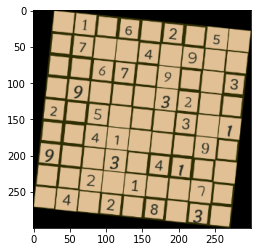

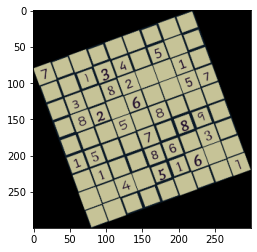

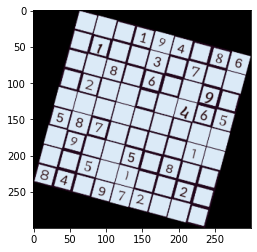

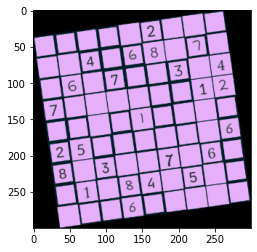

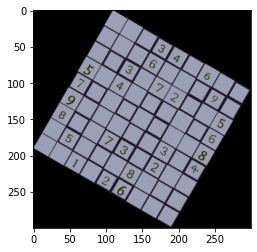

...

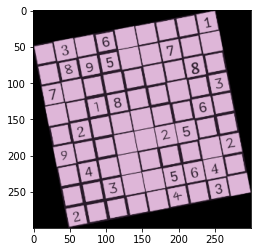

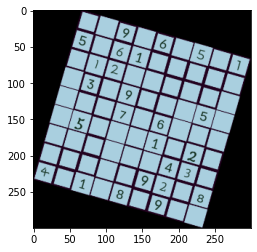

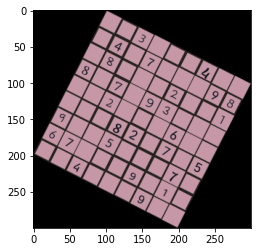

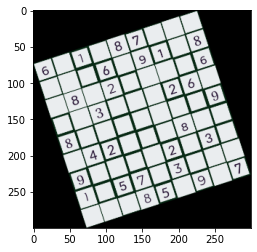

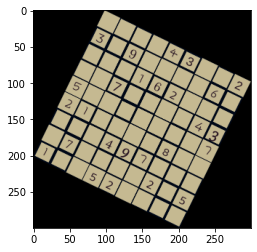

In [116]:
dir = "data/sample_train/" 
imgIDs = []
for i in range(15):
  imgIDs.append(i + 4985)
demo_images(dir, imgIDs)

# Rotating the Image

In [117]:
def pad(src):
    top = int(0.05 * src.shape[0])  # shape[0] = rows
    bottom = top
    left = int(0.05 * src.shape[1])  # shape[1] = cols
    right = left
    #     value = [randint(0, 255), randint(0, 255), randint(0, 255)]

    dst = cv2.copyMakeBorder(src, top, bottom, left, right, cv2.BORDER_CONSTANT, None,[0,0,0])
    return dst

In [118]:
def print_img(img):
  plt.imshow(img)
  plt.show()

In [119]:
# OUTDATED
def gradient(img_gray_scaled):
  gradient_matrix_x = [[-1, 0, 1], [-2, 0, 2], [-1, 0, 1]]
  gradient_matrix_y = [[-1, -2, -1], [0, 0, 0], [1, 2, 1]]
  convx = nn.Conv2d(in_channels=1, out_channels=1,kernel_size=3)
  convx.state_dict()['weight'][0][0]=torch.tensor(gradient_matrix_x)
  convy = nn.Conv2d(in_channels=1, out_channels=1,kernel_size=3)
  convy.state_dict()['weight'][0][0]=torch.tensor(gradient_matrix_y)
  grad_x = np.array(convx(img_gray_scaled))
  grad_y = np.array(convy(img_gray_scaled))
  grad_degree = np.atan2(grad_y, grad_x)
  grad_magnitude = np.hypot(grad_x, grad_y)
  grad_magnitude_gray_scaled = 255 * (grad_magnitude / grad_magnitude.max())  
  print_img(grad_magnitude_gray_scaled)
  return grad_magnitude_gray_scaled, grad_degree

In [120]:
def gradient2(img_gray_scaled, demo):
  if (demo):
    print("\nfinding \"edge\" pixels via x and y gradient convolution for detecting changes in pixel intesity:")

  # matrix designed for detecting intensity in x-direction  
  gradient_matrix_x = np.array([[-1, 0, 1], [-2, 0, 2], [-1, 0, 1]])

  # matrix designed for detecting intensity in y-direction
  gradient_matrix_y = np.array([[-1, -2, -1], [0, 0, 0], [1, 2, 1]])

  # convolution to get intensities via matrices
  grad_x = ndimage.filters.convolve(img_gray_scaled, gradient_matrix_x)
  grad_y = ndimage.filters.convolve(img_gray_scaled, gradient_matrix_y)

  # magnitude of intensities
  grad_magnitude = np.hypot(grad_y, grad_x)

  # gray scaled magnitudes
  grad_magnitude_gray_scaled = 255 * (grad_magnitude / grad_magnitude.max())
   
  return grad_magnitude_gray_scaled

In [121]:
from scipy import stats

# OUTDATED
def gradient3(img_gray_scaled):
  gradient_matrix_x = np.array([[-1, 0, 1], [-2, 0, 2], [-1, 0, 1]])
  gradient_matrix_y = np.array([[-1, -2, -1], [0, 0, 0], [1, 2, 1]])
  grad_x = ndimage.filters.convolve(img_gray_scaled, gradient_matrix_x)
  grad_y = ndimage.filters.convolve(img_gray_scaled, gradient_matrix_y)
  grad_magnitude = np.hypot(grad_y, grad_x)
  grad_magnitude_gray_scaled = 255 * (grad_magnitude / grad_magnitude.max()) 
  grad_degree = 180*np.arctan2(grad_y, grad_x)/math.pi
  print(grad_degree)
  angle_check_1_x, angle_check_1_y = np.where(grad_degree >= 60)
  angles_1 = []
  for row, col in zip(angle_check_1_x, angle_check_1_y):
    angles_1.append(grad_degree[row, col])
  print(np.median(angles_1), stats.mode(angles_1))  
  angle_check_2_x, angle_check_2_y = np.where(grad_degree >= 60)

  print("degree", np.median(grad_degree), np.average(grad_degree))
  #print(grad_magnitude_gray_scaled.dtype) 
  return grad_magnitude_gray_scaled

In [122]:
def edge_threshold(grad_magnitude_gray_scaled, threshold, demo):
    edges = np.zeros((grad_magnitude_gray_scaled.shape[0], grad_magnitude_gray_scaled.shape[1]), dtype=np.uint8)
    above_value = np.uint8(255)

    # finds rows and cols with intensity above threshold and makes those 255 in a new image  
    above_rows, above_cols = np.where(grad_magnitude_gray_scaled >= threshold)
    edges[above_rows, above_cols] = above_value
    if (demo):
        print_img(edges)
    return edges

In [123]:
def add_values(values, first_value, last_value, value_increment):
  value = first_value 
  while (value <= last_value):
    values.append(value)
    value += value_increment
  return values  

In [124]:
# OUTDATED
def accumulator(edge_pixels, threshold, first_degree1, last_degree1, first_degree2, last_degree2, degree_increment):
    max_d = int(max_line_length(edge_pixels))
    acc = np.zeros((max_d * 2, 180), dtype=np.uint8)
    degrees = []
    above_rows, above_cols = np.where(edge_pixels == 255)
    degrees = add_degrees(degrees, first_degree1, last_degree1, degree_increment)  
    degrees = add_degrees(degrees, first_degree2, last_degree2, degree_increment)  
    for row, col in zip(above_rows, above_cols):
      for degree in degrees:
        radian = np.deg2rad(degree)
        distance = int(row * math.cos(radian) + col * math.sin(radian)) + max_d
        #print (degree, radian, distance - max_d)
        acc[distance, degree] += 1     
    above_distances_lines, above_degrees_lines = np.where(acc >= threshold) 
    print(above_distances_lines, above_degrees_lines)
    return above_distances_lines, above_degrees_lines 

In [125]:
def construct_accumulator(distances_checking, degrees_checking):
  # sets up the voting for user inputed degree ranges (and hard coded distances)
  acc = {}  
  for distance in distances_checking:
    for degree in degrees_checking:
      acc[distance, degree] = 0
  return acc  

In [126]:
def accumulator3(edge_pixels, threshold, first_degree1, last_degree1, first_degree2, last_degree2, degree_increment, negative_angle):
    max_d = int(max_line_length(edge_pixels))
    distances_checking = []
    distances_checking = add_values(distances_checking, -max_d, max_d, 1)
    degrees_checking = []
    degrees_checking = add_values(degrees_checking, first_degree1, last_degree1, degree_increment)  
    degrees_checking = add_values(degrees_checking, first_degree2, last_degree2, degree_increment)  
    acc = construct_accumulator(distances_checking, degrees_checking)
    above_rows, above_cols = np.where(edge_pixels == 255)
    for row, col in zip(above_rows, above_cols):
      # pseudo probabalistic factor (only 1/9 pixels checked, cuts down time)
      if (row%3 != 0 or col%3 != 0):
        continue
      for degree in degrees_checking:

        #calculate line (p, theta) and update accumulator (voting mechanism)
        radian = np.deg2rad(degree)
        distance = int(row * math.cos(radian) + col * math.sin(radian))
        acc[distance, degree] += 1
    above_distances_lines, above_degrees_lines = find_lines_percentage(acc, threshold)
    return above_distances_lines, above_degrees_lines 

In [127]:
# OUTDATED
def accumulator2(edge_pixels, threshold, first_degree1, last_degree1, first_degree2, last_degree2, degree_increment):
    max_d = int(max_line_length(edge_pixels))
    acc = np.zeros((max_d * 2, 180), dtype=np.uint8)
    degrees = []
    above_rows, above_cols = np.where(edge_pixels == 255)
    board_height = above_rows.max() - above_rows.min()
    board_width = above_cols.max() - above_cols.min()
    cutoff_decimal = 0.25
    degrees = add_values(degrees, first_degree1, last_degree1, degree_increment)  
    degrees = add_values(degrees, first_degree2, last_degree2, degree_increment)  
    for row, col in zip(above_rows, above_cols):
      if row > ((cutoff_decimal * board_height) + above_rows.min()) and (col > (cutoff_decimal * board_width) + above_cols.min()):
        continue
      for degree in degrees:
        radian = np.deg2rad(degree)
        distance = int(row * math.cos(radian) + col * math.sin(radian)) + max_d
        #print (degree, radian, distance - max_d)
        acc[distance, degree] += 1     
    above_distances_lines, above_degrees_lines = np.where(acc >= threshold)    
    return above_distances_lines, above_degrees_lines 

In [128]:
# OUTDATED
def compute_lines(distances, degrees, edge_pixels, max_d, demo):
  line_img = np.zeros((edge_pixels.shape[0], edge_pixels.shape[1]), dtype=np.uint8)
  lines = []
  angles = []
  for distance, degree in zip(distances, degrees):

    # image is "rotated" already so lines need to be adjusted as well to find needed rotation for our eyes :(        
    #print(degree + 90)  
    a_offset=math.cos(np.deg2rad(degree + 90))
    b_offset=math.sin(np.deg2rad(degree + 90))          
    offsetx0=(distance - max_d)*a_offset
    offsety0=(distance - max_d)*b_offset  

    # find points on the same line
    offsetx1=int(offsetx0 - 1000* b_offset)
    offsety1=int(offsety0 + 1000* a_offset)
    offsetx2=int(offsetx0 + 1000* b_offset)
    offsety2=int(offsety0 - 1000 * a_offset)

    # calculate angle of line from the two points
    angle = math.degrees(math.atan2((offsety2 - offsety1),(offsetx2 - offsetx1)))

    # demo threshold: shouldn't be necessary if accumulator screens properly
    if ((angle >= 60 and angle <= 90) or (angle >= 0 and angle <= 30)):
      angles.append(angle) 

  median_angle = np.median(angles)  
  if (demo):
    print_lines(distances, degrees, edge_pixels, line_img, median_angle, max_d)             
  return median_angle

In [129]:
def compute_lines2(distances, degrees, edge_pixels, demo):
  line_img = 0
  lines = []
  angles = []
  for distance, degree in zip(distances, degrees):
    #print(degree + 90) 
    # image is "rotated" already so lines need to be adjusted as well to find needed rotation for our eyes :(
    a_offset=math.cos(np.deg2rad(degree + 90))
    b_offset=math.sin(np.deg2rad(degree + 90))          
    offsetx0=(distance)*a_offset
    offsety0=(distance)*b_offset  

    # find points on the same line
    offsetx1=int(offsetx0 - 1000* b_offset)
    offsety1=int(offsety0 + 1000* a_offset)
    offsetx2=int(offsetx0 + 1000* b_offset)
    offsety2=int(offsety0 - 1000 * a_offset)

    # calculate angle of line from the two points    
    angle = (180/math.pi) * (math.atan2((offsety2 - offsety1),(offsetx2 - offsetx1)))

    if (demo):
      # demo threshold: shouldn't be necessary normally if accumulator screens properly
      if ((angle > 0 and angle <= 30) or (angle < 0 and angle >= -30)):
        angles.append(angle) 
    else:
      angles.append(angle) 

  median_angle = np.median(angles)  
  if (demo):
    print_lines2(distances, degrees, edge_pixels, line_img, median_angle)             
  return median_angle

In [130]:
# OUTDATED
def print_lines(distances, degrees, edge_pixels, line_img, median, max_d):
  lines = []
  angles = []
  line_img = np.zeros((edge_pixels.shape[0], edge_pixels.shape[1]), dtype=np.uint8)
  for distance, degree in zip(distances, degrees):

    # for showing lines (see next) 
    a=math.cos(np.deg2rad(degree))
    b=math.sin(np.deg2rad(degree))
    x0=(distance - max_d)*a
    y0=(distance - max_d)*b  

    # image is "rotated" already so lines need to be adjusted as well to find needed rotation for our eyes :(
    a_offset=math.cos(np.deg2rad(degree + 90))
    b_offset=math.sin(np.deg2rad(degree + 90))          
    offsetx0=(distance - max_d)*a_offset
    offsety0=(distance - max_d)*b_offset  

    # making sure lines appear: finding far apart points   
    x1=int(x0+1000*(-b))
    y1=int(y0+1000*(a))
    x2=int(x0-1000*(-b))
    y2=int(y0-1000*(a))

    # find another point on the same line
    offsetx1=int(offsetx0 - 1000* b_offset)
    offsety1=int(offsety0 + 1000* a_offset)
    offsetx2=int(offsetx0 + 1000* b_offset)
    offsety2=int(offsety0 - 1000 * a_offset)

    angle = math.degrees(math.atan2((offsety2 - offsety1),(offsetx2 - offsetx1)))
    
    # sets of lines are perpendicular: from the median of the first set of lines, find the second set as well 
    if ((angle > median + 88.5 and angle < median + 91.5) or (angle > median - 1 and angle < median + 1 )):
      # draw line          
      cv2.line(line_img,(y1, x1),(y2, x2),(100,100,100),2)   
  print_img(line_img)

In [131]:
def print_lines2(distances, degrees, edge_pixels, line_img, median):
  lines = []
  angles = []
  line_img = np.zeros((edge_pixels.shape[0], edge_pixels.shape[1]), dtype=np.uint8)
  for distance, degree in zip(distances, degrees):

    # for showing lines (see next) 
    a=math.cos(np.deg2rad(degree))
    b=math.sin(np.deg2rad(degree))
    x0=(distance)*a
    y0=(distance)*b  

    # image is "rotated" already so lines need to be adjusted as well to find needed rotation for our eyes :(
    a_offset=math.cos(np.deg2rad(degree + 90))
    b_offset=math.sin(np.deg2rad(degree + 90))          
    offsetx0=(distance)*a_offset
    offsety0=(distance)*b_offset  

    # making sure lines appear: finding far apart points   
    x1=int(x0+1000*(-b))
    y1=int(y0+1000*(a))
    x2=int(x0-1000*(-b))
    y2=int(y0-1000*(a))

    # find another point on the same line
    offsetx1=int(offsetx0 - 1000* b_offset)
    offsety1=int(offsety0 + 1000* a_offset)
    offsetx2=int(offsetx0 + 1000* b_offset)
    offsety2=int(offsety0 - 1000 * a_offset)


    angle = math.degrees(math.atan2((offsety2 - offsety1),(offsetx2 - offsetx1)))
    
    # sets of lines are perpendicular: from the median of the first set of lines, find the second set as well 
    if ((angle > median + 88.5 and angle < median + 91.5) or (angle > median - 1 and angle < median + 1 )):
      # draw line          
      cv2.line(line_img,(y1, x1),(y2, x2),(100,100,100),2)   
  print("lines found by scoring algorithm (both sets):")
  print_img(line_img) 
  print("rotating image by the median of line angles found for one set:")

In [132]:
def max_line_length(img):
  width = img.shape[0]
  height = img.shape[1]
  return np.hypot(width, height)

In [133]:

# method of defining lines via the amount of edge pixels (defined with threshold)
# that it "intersects" as per checked angles and distances  
def find_lines(acc, threshold):  
   above_distances_lines = []
   above_degrees_lines = [] 
   for distance, degree in acc.keys():     
     if acc[distance, degree] >= threshold:
       above_distances_lines.append(distance)
       above_degrees_lines.append(degree)
   return above_distances_lines, above_degrees_lines 

In [134]:

# method of finding lines based on percentile (threshold_percentage), where score is based on 
# "intersected" edge pixels as with the first method 
def find_lines_percentage(acc, threshold_percentage):  
   above_distances_lines = []
   above_degrees_lines = [] 
   values = sorted(acc.values())
   minimum = int(len(values) * (threshold_percentage / 100)) 
   threshold = values[minimum] 
   for distance, degree in acc.keys():     
     if acc[distance, degree] >= threshold:
       above_distances_lines.append(distance)
       above_degrees_lines.append(degree)
   #print(above_distances_lines)
   #print(above_degrees_lines)
   return above_distances_lines, above_degrees_lines

In [135]:
# OUTDATED
def read4(str, demo = False):  
    img_before = cv2.imread(str) 
    img_before = pad(img_before)
    img_gray = cv2.cvtColor(img_before, cv2.COLOR_BGR2GRAY)    
    edge_pixels = edge_threshold(gradient2(img_gray), 10, demo)
    above_distances_lines = 0
    above_degrees_lines = 0
    if (demo):
        above_distances_lines, above_degrees_lines = accumulator(edge_pixels, 200, 0, 179, 0, 0, 1)
    else:
        above_distances_lines, above_degrees_lines = accumulator(edge_pixels, 200, 0, 30, 60, 89, 1)
    median_angle = compute_lines(above_distances_lines, above_degrees_lines, edge_pixels, max_line_length(edge_pixels), demo)    
    if (median_angle < 1 or median_angle > 89):
      return img_before
    elif (median_angle > 45):
      print("rotating", 90 - median_angle, "degrees")
      img_rotated = ndimage.rotate(img_before, 90 - median_angle)
      return img_rotated
    else:  
      print("rotating", - median_angle, "degrees")
      img_rotated = ndimage.rotate(img_before,median_angle)
      return img_rotated

In [136]:
def read5(str, demo = False, test = False):  
    img_before = cv2.imread(str)     
    img_before = pad(img_before)
    img_gray = cv2.cvtColor(img_before, cv2.COLOR_BGR2GRAY)  
    edge_pixels = edge_threshold(gradient2(img_gray, demo), 10, demo)
    negative_angle = -1
    estimate_angle = corner_rotation(edge_pixels, demo, test)  

    # image is upright, therefore no need to rotate    
    if (estimate_angle == 0):
      return img_before

    # switching from angle to rotate for straightening to angle it is at     
    estimate_angle = -estimate_angle 

    if (estimate_angle > 0):
      negative_angle = True 
    else:
      negative_angle = False

    above_distances_lines = 0
    above_degrees_lines = 0
    if (demo):
        print("scoring lines via the amount of edge pixels captured by a line defined by polar coordinates (angle, distance)")
        above_distances_lines, above_degrees_lines = accumulator3(edge_pixels, 99, estimate_angle - 2.5, estimate_angle + 2.5, estimate_angle + 87.5, estimate_angle + 92.5, 0.5, negative_angle)
    else:
        above_distances_lines, above_degrees_lines = accumulator3(edge_pixels, 99, estimate_angle - 2.5, estimate_angle + 2.5, 0, -1, 0.5, negative_angle)
    
    median_angle = compute_lines2(above_distances_lines, above_degrees_lines, edge_pixels, demo)    

    # algo has found the "positive" angle (median_angle), and assumes the correct
    # method to rotate is the closest upright position
    if (median_angle > 45):
      if (not test):
        print("rotating", 90 - median_angle, "degrees")
        print("estimate adjusted by", estimate_angle - median_angle, "degrees")
      img_rotated = ndimage.rotate(img_before, 90 - median_angle)      
      return img_rotated
    else:  
      if (not test):
        print("rotating", -median_angle, "degrees")
        print("estimate adjusted by", estimate_angle - median_angle, "degrees")    
      img_rotated = ndimage.rotate(img_before, -median_angle)
      return img_rotated

In [137]:
def corner_rotation(edge_pixels, demo = False, test = False):  
  if (demo):   
    print("estimating angle from corners of edge pixel image:")   
  edge_rows, edge_cols = np.where(edge_pixels == 255)

  # finding the four corners
  min_row = edge_rows.min()
  min_row_col = 0
  for i in edge_cols:                        
    if edge_pixels[min_row][i] == 255:
       min_row_col = i
       break
  max_row = edge_rows.max()
  max_row_col = 0 
  for i in edge_cols:                        
    if edge_pixels[max_row][i] == 255:
       max_row_col = i
       break
  min_col = edge_cols.min()
  min_col_row = 0
  for i in edge_rows:                        
    if edge_pixels[i][min_col] == 255:
       min_col_row = i
       break
  max_col = edge_cols.max()  
  max_col_row = 0
  for i in edge_rows:
    if edge_pixels[i][max_col] == 255:
      max_col_row = i
      break  
  if (demo):    
    print("four corners:")   
    print("(" + str(min_row) + "," + str(min_row_col) + ")")   
    print("(" + str(max_row) + "," + str(max_row_col) + ")") 
    print("(" + str(min_col_row) + "," + str(min_col) + ")")
    print("(" + str(max_col_row) + "," + str(max_col) + ")") 

  if (abs(min_col_row - max_row) < 4 or (abs(min_col_row - min_row) < 4)):
    return 0 

  # average angle between the two "horizontal" outline edges as calculated with corners          
  angle = ((180/math.pi)*(math.atan2(max_col_row - max_row, max_col - max_row_col)) + (180/math.pi) * (math.atan2(min_row - min_col_row, min_row_col - min_col)))/2  
  
  if (min_col_row > max_col_row):
    angle += 90
  if (not test): 
    print("estimate angle:", angle, "degrees\n")  
  return angle

In [138]:
def crop_image(img_rotated, demo = False):
  img_gray = cv2.cvtColor(img_rotated, cv2.COLOR_BGR2GRAY)   
  img_edges = edge_threshold(gradient2(img_gray, demo), 100, demo)
  if (demo):
    print("\ncropping straightened image based on minimum and maximum \"edge\" pixel indexes above")
  edge_rows, edge_cols = np.where(img_edges == 255)

  # finds where the puzzle is and assumes it is straigtened
  min_row = edge_rows.min() + 3
  max_row = edge_rows.max() - 3 
  min_col = edge_cols.min() + 3
  max_col = edge_cols.max() - 3
  diff_row = max_row - min_row 
  diff_col = max_col - min_col
  img_cropped = np.zeros((diff_row, diff_col, 3), dtype=np.uint8)
  for numRow in range(diff_row):
    for numCol in range(diff_col):
      # translates image appropriatel into resized image (a crop in the end) 
      img_cropped[numRow, numCol] = img_rotated[numRow + min_row, numCol + min_col]
  if (demo):
    print("\nimage cropped to size") 
    print_img(img_cropped)   
  return img_cropped  

In [139]:
def test_algo(dir, imgIDs, demo = False):
  for ID in imgIDs:
    path = dir + str(ID) + '.png' 
    plt.imshow(plt.imread(path))
    plt.show()
    img = path
    img_rotated = read4(img, demo)
    if (demo):
      print_img(img_rotated) 
    img_cropped = crop_image(img_rotated)
    if (demo):
      print_img(img_cropped) 
    img_formatted = cv2.resize(img_cropped, (300,300))
    print_img(img_formatted) 

In [140]:
def get_image_formatted(path, demo = False, test = False):
    if (not test): 
      print("\n\n\nsudoku image")
      plt.imshow(plt.imread(path))    
      plt.show()
    img = path
    img_rotated = read5(img, demo, test)
    if (demo):
      print_img(img_rotated) 
    img_cropped = crop_image(img_rotated, demo)     
    img_formatted = cv2.resize(img_cropped, (300,300))
    if (not test):
      print("\nresized image to 300x300 using cv2.resize method")
      print_img(img_formatted)
    return img_formatted 

In [141]:
def test_algo2(dir, imgIDs, demo = False, test = False):
  total_time = 0 
  numImages = len(imgIDs) 
  for ID in imgIDs:
    path = dir + str(ID) + '.png'
    t1 = time.time()
    img_formatted = get_image_formatted(path, demo, test)
    t2 = time.time()
    diff = t2 - t1
    print("time for image " + str(ID) + ":", diff, "seconds")
    total_time += diff
  print("algorithm complete with", total_time/numImages, "seconds per image") 


finding "edge" pixels via x and y gradient convolution for detecting changes in pixel intesity:


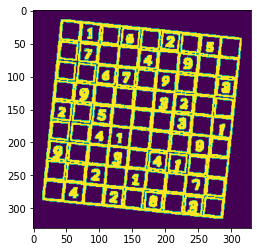

estimating angle from corners of edge pixel image:
four corners:
(14,42)
(315,273)
(273,14)
(42,315)
scoring lines via the amount of edge pixels captured by a line defined by polar coordinates (angle, distance)
lines found by scoring algorithm (both sets):


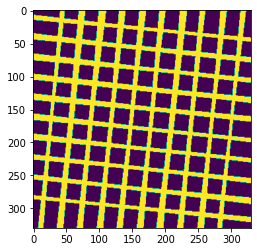

rotating image by the median of line angles found for one set:


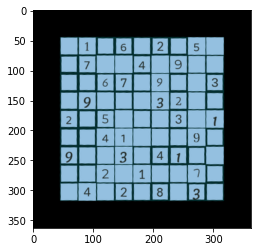


finding "edge" pixels via x and y gradient convolution for detecting changes in pixel intesity:


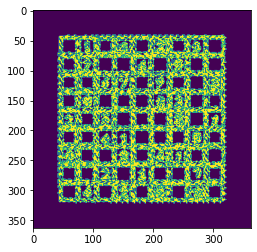


cropping straightened image based on minimum and maximum "edge" pixel indexes above

image cropped to size


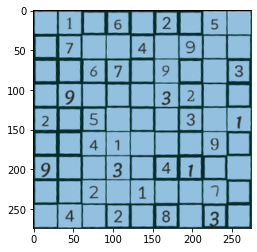

time for image 4985: 2.0013492107391357 seconds

finding "edge" pixels via x and y gradient convolution for detecting changes in pixel intesity:


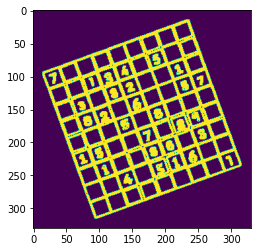

estimating angle from corners of edge pixel image:
four corners:
(14,231)
(315,96)
(93,14)
(231,315)
scoring lines via the amount of edge pixels captured by a line defined by polar coordinates (angle, distance)
lines found by scoring algorithm (both sets):


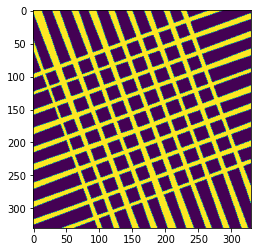

rotating image by the median of line angles found for one set:


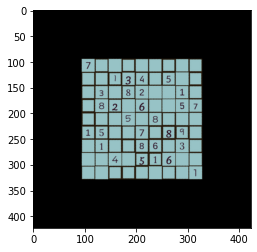


finding "edge" pixels via x and y gradient convolution for detecting changes in pixel intesity:


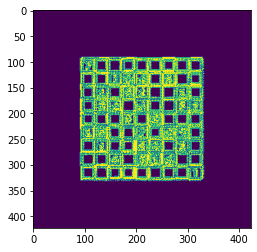


cropping straightened image based on minimum and maximum "edge" pixel indexes above

image cropped to size


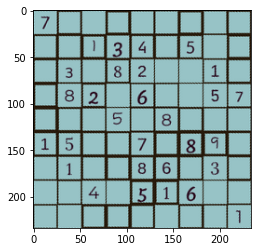

time for image 4986: 1.6621766090393066 seconds

finding "edge" pixels via x and y gradient convolution for detecting changes in pixel intesity:


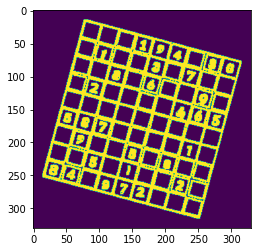

estimating angle from corners of edge pixel image:
four corners:
(14,77)
(315,247)
(247,14)
(77,315)
scoring lines via the amount of edge pixels captured by a line defined by polar coordinates (angle, distance)
lines found by scoring algorithm (both sets):


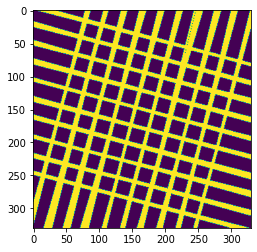

rotating image by the median of line angles found for one set:


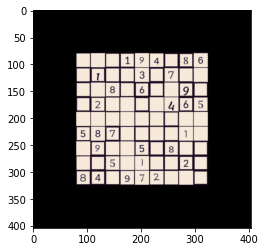


finding "edge" pixels via x and y gradient convolution for detecting changes in pixel intesity:


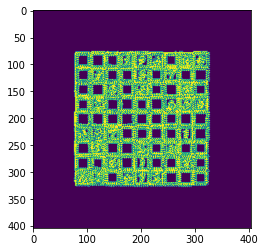


cropping straightened image based on minimum and maximum "edge" pixel indexes above

image cropped to size


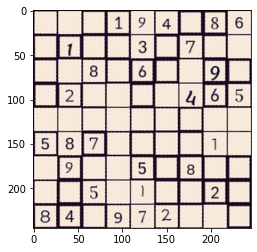

time for image 4987: 1.7225162982940674 seconds

finding "edge" pixels via x and y gradient convolution for detecting changes in pixel intesity:


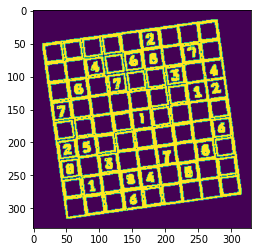

estimating angle from corners of edge pixel image:
four corners:
(14,269)
(315,55)
(50,14)
(269,315)
scoring lines via the amount of edge pixels captured by a line defined by polar coordinates (angle, distance)
lines found by scoring algorithm (both sets):


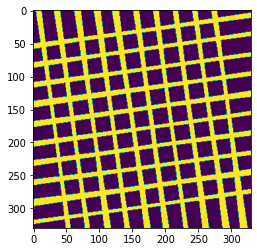

rotating image by the median of line angles found for one set:


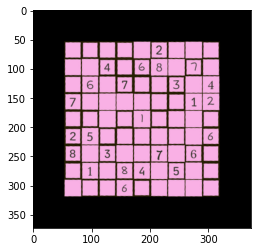


finding "edge" pixels via x and y gradient convolution for detecting changes in pixel intesity:


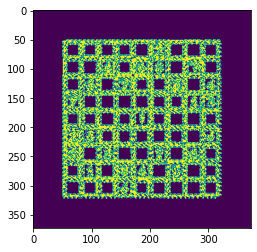


cropping straightened image based on minimum and maximum "edge" pixel indexes above

image cropped to size


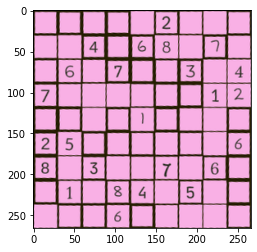

time for image 4988: 1.7691676616668701 seconds

finding "edge" pixels via x and y gradient convolution for detecting changes in pixel intesity:


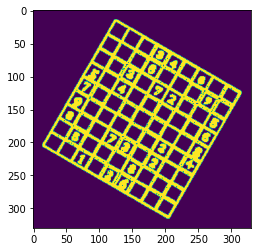

estimating angle from corners of edge pixel image:
four corners:
(14,123)
(315,202)
(202,14)
(123,315)
scoring lines via the amount of edge pixels captured by a line defined by polar coordinates (angle, distance)
lines found by scoring algorithm (both sets):


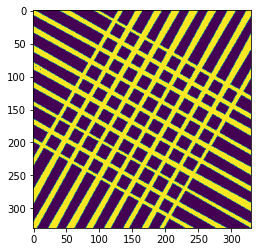

rotating image by the median of line angles found for one set:


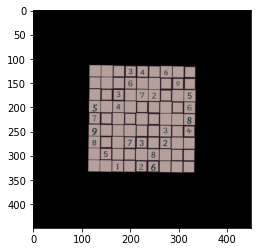


finding "edge" pixels via x and y gradient convolution for detecting changes in pixel intesity:


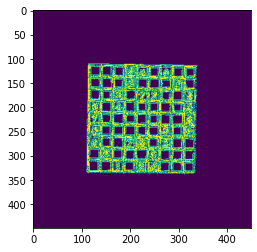


cropping straightened image based on minimum and maximum "edge" pixel indexes above

image cropped to size


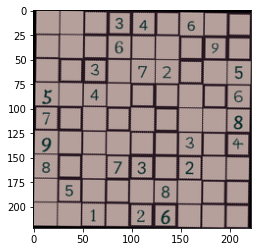

time for image 4989: 1.6435661315917969 seconds

finding "edge" pixels via x and y gradient convolution for detecting changes in pixel intesity:


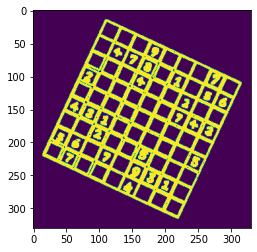

estimating angle from corners of edge pixel image:
four corners:
(14,109)
(315,217)
(217,14)
(109,315)
scoring lines via the amount of edge pixels captured by a line defined by polar coordinates (angle, distance)
lines found by scoring algorithm (both sets):


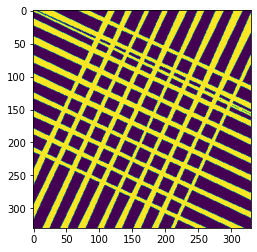

rotating image by the median of line angles found for one set:


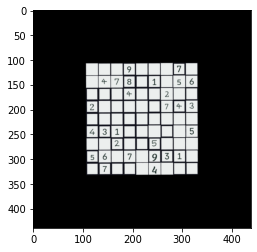


finding "edge" pixels via x and y gradient convolution for detecting changes in pixel intesity:


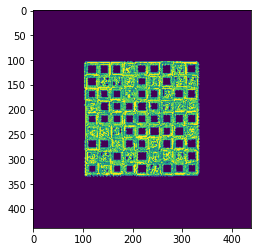


cropping straightened image based on minimum and maximum "edge" pixel indexes above

image cropped to size


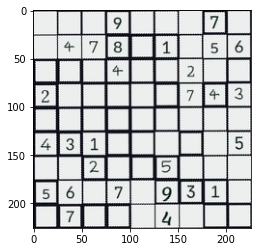

time for image 4990: 1.7004828453063965 seconds

finding "edge" pixels via x and y gradient convolution for detecting changes in pixel intesity:


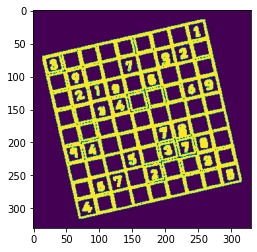

estimating angle from corners of edge pixel image:
four corners:
(14,253)
(315,75)
(69,14)
(253,315)
scoring lines via the amount of edge pixels captured by a line defined by polar coordinates (angle, distance)
lines found by scoring algorithm (both sets):


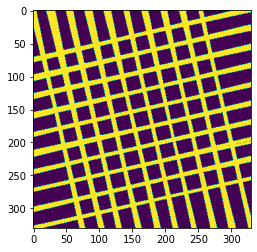

rotating image by the median of line angles found for one set:


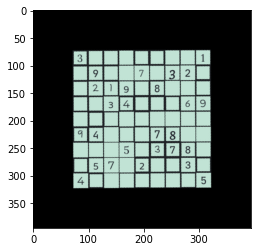


finding "edge" pixels via x and y gradient convolution for detecting changes in pixel intesity:


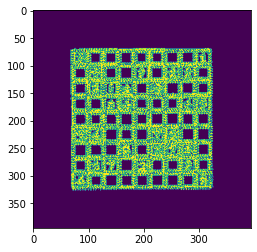


cropping straightened image based on minimum and maximum "edge" pixel indexes above

image cropped to size


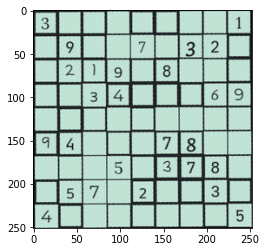

time for image 4991: 1.826097011566162 seconds

finding "edge" pixels via x and y gradient convolution for detecting changes in pixel intesity:


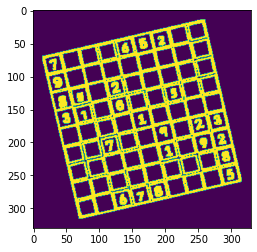

estimating angle from corners of edge pixel image:
four corners:
(14,253)
(315,72)
(69,14)
(253,315)
scoring lines via the amount of edge pixels captured by a line defined by polar coordinates (angle, distance)
lines found by scoring algorithm (both sets):


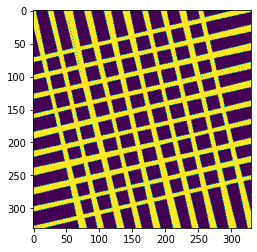

rotating image by the median of line angles found for one set:


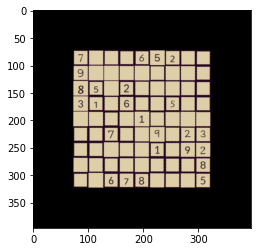


finding "edge" pixels via x and y gradient convolution for detecting changes in pixel intesity:


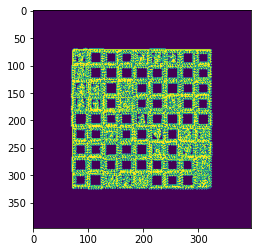


cropping straightened image based on minimum and maximum "edge" pixel indexes above

image cropped to size


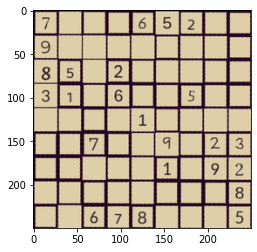

time for image 4992: 2.0475590229034424 seconds

finding "edge" pixels via x and y gradient convolution for detecting changes in pixel intesity:


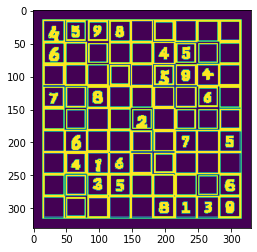

estimating angle from corners of edge pixel image:
four corners:
(14,14)
(315,14)
(14,14)
(14,315)


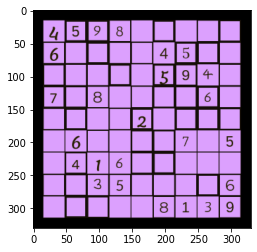


finding "edge" pixels via x and y gradient convolution for detecting changes in pixel intesity:


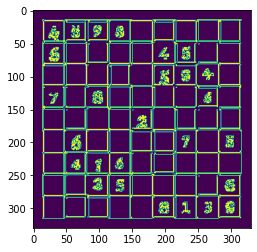


cropping straightened image based on minimum and maximum "edge" pixel indexes above

image cropped to size


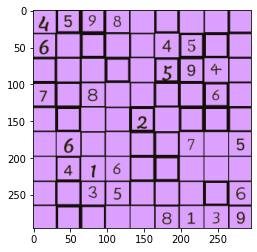

time for image 4993: 0.92452073097229 seconds

finding "edge" pixels via x and y gradient convolution for detecting changes in pixel intesity:


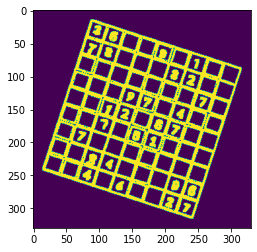

estimating angle from corners of edge pixel image:
four corners:
(14,87)
(315,237)
(237,14)
(87,315)
scoring lines via the amount of edge pixels captured by a line defined by polar coordinates (angle, distance)
lines found by scoring algorithm (both sets):


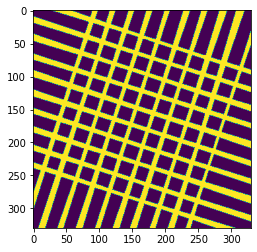

rotating image by the median of line angles found for one set:


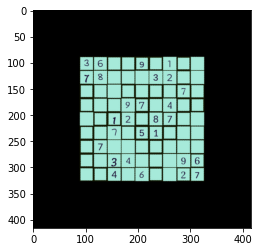


finding "edge" pixels via x and y gradient convolution for detecting changes in pixel intesity:


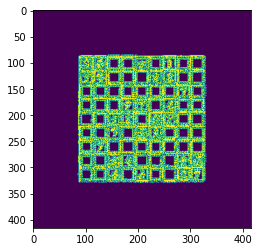


cropping straightened image based on minimum and maximum "edge" pixel indexes above

image cropped to size


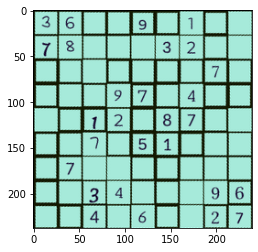

time for image 4994: 1.809386968612671 seconds

finding "edge" pixels via x and y gradient convolution for detecting changes in pixel intesity:


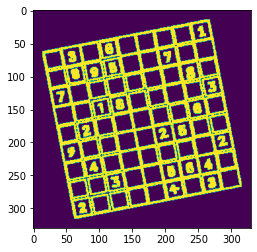

estimating angle from corners of edge pixel image:
four corners:
(14,259)
(315,69)
(62,14)
(259,315)
scoring lines via the amount of edge pixels captured by a line defined by polar coordinates (angle, distance)
lines found by scoring algorithm (both sets):


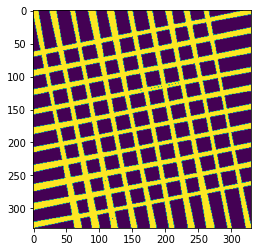

rotating image by the median of line angles found for one set:


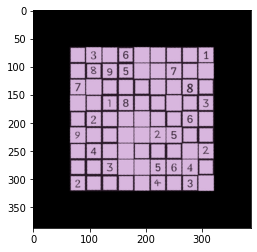


finding "edge" pixels via x and y gradient convolution for detecting changes in pixel intesity:


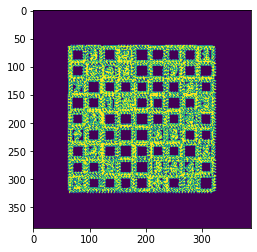


cropping straightened image based on minimum and maximum "edge" pixel indexes above

image cropped to size


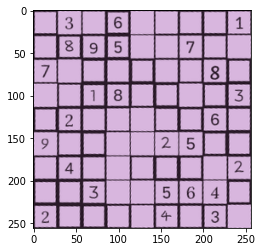

time for image 4995: 1.9182720184326172 seconds

finding "edge" pixels via x and y gradient convolution for detecting changes in pixel intesity:


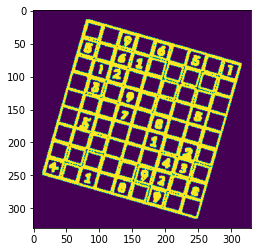

estimating angle from corners of edge pixel image:
four corners:
(14,80)
(315,243)
(243,14)
(80,315)
scoring lines via the amount of edge pixels captured by a line defined by polar coordinates (angle, distance)
lines found by scoring algorithm (both sets):


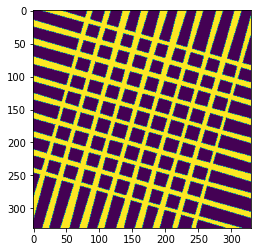

rotating image by the median of line angles found for one set:


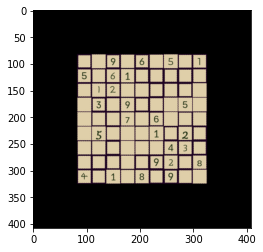


finding "edge" pixels via x and y gradient convolution for detecting changes in pixel intesity:


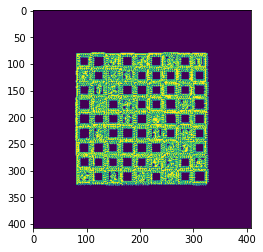


cropping straightened image based on minimum and maximum "edge" pixel indexes above

image cropped to size


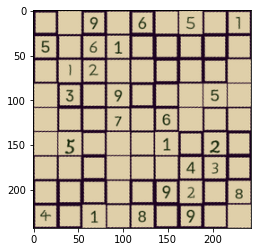

time for image 4996: 1.8489162921905518 seconds

finding "edge" pixels via x and y gradient convolution for detecting changes in pixel intesity:


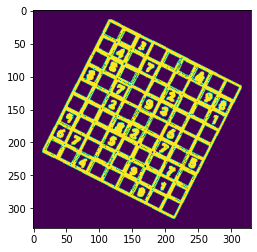

estimating angle from corners of edge pixel image:
four corners:
(14,114)
(315,211)
(211,14)
(114,315)
scoring lines via the amount of edge pixels captured by a line defined by polar coordinates (angle, distance)
lines found by scoring algorithm (both sets):


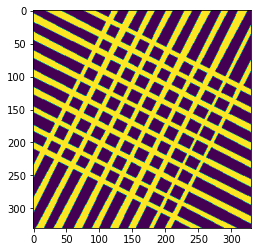

rotating image by the median of line angles found for one set:


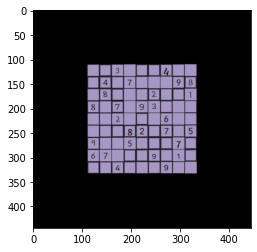


finding "edge" pixels via x and y gradient convolution for detecting changes in pixel intesity:


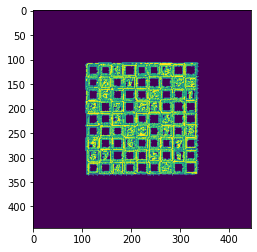


cropping straightened image based on minimum and maximum "edge" pixel indexes above

image cropped to size


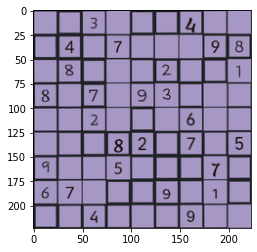

time for image 4997: 1.8153064250946045 seconds

finding "edge" pixels via x and y gradient convolution for detecting changes in pixel intesity:


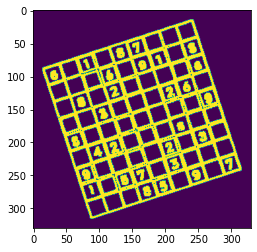

estimating angle from corners of edge pixel image:
four corners:
(14,237)
(315,89)
(87,14)
(237,315)
scoring lines via the amount of edge pixels captured by a line defined by polar coordinates (angle, distance)
lines found by scoring algorithm (both sets):


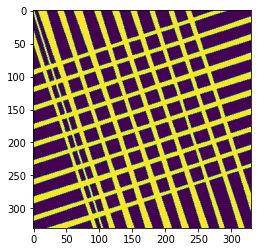

rotating image by the median of line angles found for one set:


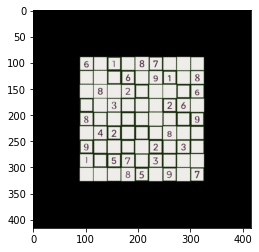


finding "edge" pixels via x and y gradient convolution for detecting changes in pixel intesity:


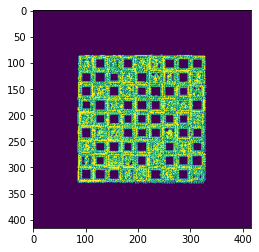


cropping straightened image based on minimum and maximum "edge" pixel indexes above

image cropped to size


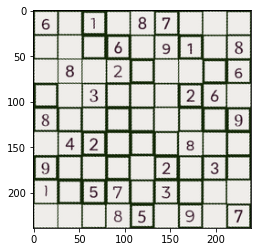

time for image 4998: 1.8837711811065674 seconds

finding "edge" pixels via x and y gradient convolution for detecting changes in pixel intesity:


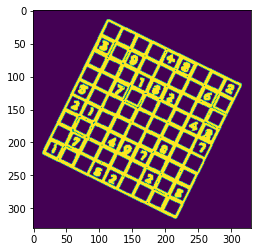

estimating angle from corners of edge pixel image:
four corners:
(14,112)
(315,214)
(214,14)
(111,315)
scoring lines via the amount of edge pixels captured by a line defined by polar coordinates (angle, distance)
lines found by scoring algorithm (both sets):


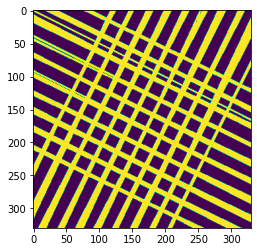

rotating image by the median of line angles found for one set:


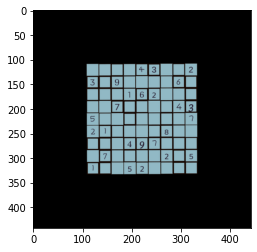


finding "edge" pixels via x and y gradient convolution for detecting changes in pixel intesity:


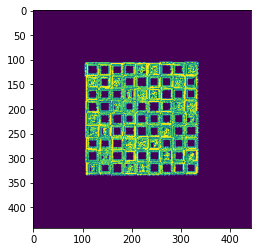


cropping straightened image based on minimum and maximum "edge" pixel indexes above

image cropped to size


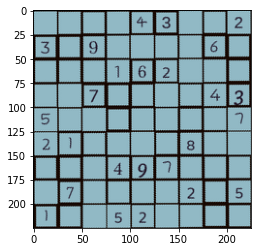

time for image 4999: 1.8487300872802734 seconds
algorithm complete with 1.7614545663197836 seconds per image


In [142]:
dir = "data/sample_train/" 
imgIDs = []
for i in range(15):
  imgIDs.append(i + 4985)

# first boolean = demo (show all steps)
# second boolean = test (timed with no prints), demo = False
# this configuration is slower and less accurate but informative to the process 
test_algo2(dir, imgIDs, True, True)

# Get Individual Cells

In [143]:
#get square by index in sudoku board, starting from (0,0) and ending at (8,8)
#image in raw form
def get_square_2d(x,y,image): 
  x1, x2=33*x, 33*(x+1)
  y1, y2=33*y, 33*(y+1)
  #if (x<3):
  x1+=4
  x2+=1
  #if (y<3):
  y1+=4
  y2+=1
  return image[x1:x2,y1:y2]

#get square by index of string in row-whatever-form of suduko, ind from 0-80 covering all 81 squares
def get_square(ind, image):
  return get_square_2d(int(ind/9),int(ind%9),image)

Demo Cells

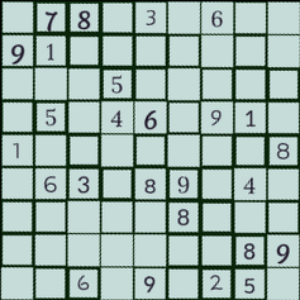

In [144]:
from google.colab.patches import cv2_imshow
path = "data/sample_test/4992.png"
image = get_image_formatted(path, demo = False, test = True)
cv2_imshow(image)
for i in range(81):
  cell = get_square(i, image)
  cv2_imshow(cell)

In [145]:
def show_data(data_sample):
    plt.imshow(data_sample[0].numpy().reshape(28, 28), cmap='gray')
    plt.title('y = '+ str(data_sample[1]))

# Set up Function to Solve Puzzle

In [146]:
#Solves row major form puzzles
def findSolution(sudokuPuzzle):
  sudokuPuzzle = list(sudokuPuzzle)

  board = [ [0]*9 for _ in range(9) ]
  for i in range(9):
    for j in range(9):
      if(sudokuPuzzle[9*i + j] != '_'):
        board[i][j] = ord(sudokuPuzzle[9*i + j]) - ord('0')

  puzzle = Sudoku(3, 3, board=board)
  solution = puzzle.solve()

  # puzzle.show()
  # solution.show()

  if solution.board[0][0] == None:
    return "no solution"

  solutionGrid = [[str(j) for j in i] for i in solution.board]
  solutionString = ""
  for row in solutionGrid:
    solutionString += "".join(row)

  return solutionString

# Prepare to Read Cell Data

In [147]:

from skimage.segmentation import clear_border
from tensorflow.keras.preprocessing.image import img_to_array
import math

# NOT USED
def extract_digit(cell,):
# apply automatic thresholding to the cell and then clear any
    # connected borders that touch the border of the cell
    #thresh = cv2.threshold(cell, 175, 255,
        #cv2.THRESH_BINARY_INV | cv2.THRESH_OTSU)[1]
   #thresh = clear_border(thresh)
    
    cnts = cv2.findContours(cell.copy(), cv2.RETR_EXTERNAL,
        cv2.CHAIN_APPROX_SIMPLE)
    #cv2_imshow(thresh)
    cnts = imutils.grab_contours(cnts)
    if len(cnts) == 0:
        return None
    c = max(cnts, key=cv2.contourArea)
    mask = np.zeros(cell.shape, dtype="uint8")
    cv2.drawContours(mask, [c], -1, 255, -1)
    
    (h, w) = cell.shape
    percentFilled = cv2.countNonZero(mask) / float(w * h)
    # if less than 3% of the mask is filled then we are looking at
    # noise and can safely ignore the contour
    if percentFilled < 0.03:
        return None
    # apply the mask to the thresholded cell
    
    digit = cv2.bitwise_and(cell, cell, mask=mask)
    #digit = center_image(digit)
    return digit

In [148]:
#Find shift to mid by weight
def getBestShift(img):
    cy,cx = ndimage.measurements.center_of_mass(img)

    rows,cols = img.shape
    shiftx = np.round(cols/2.0-cx).astype(int)
    shifty = np.round(rows/2.0-cy).astype(int)

    return shiftx,shifty

In [149]:
#shift image using translation matrix
def shift(img,sx,sy):
    rows,cols = img.shape
    M = np.float32([[1,0,sx],[0,1,sy]])
    shifted = cv2.warpAffine(img,M,(cols,rows))
    return shifted

In [150]:
#Determine if cell is completely empty
def is_empty(cell): 
  # print(cell)
  cell = cv2.cvtColor(cell, cv2.COLOR_BGR2GRAY)
  ret,cell = cv2.threshold(cell,150,255,cv2.THRESH_BINARY)
  cell = np.invert(cell)
  #26x26 cell
  cell = cell[5:20, 5:20] #15x15 cell w/out borders
  for i in range(15):
    for j in range(15):
      if (cell[i][j]!=0):
        return False
  return True

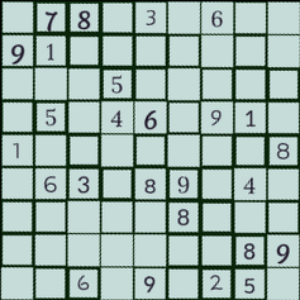

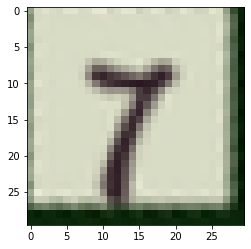

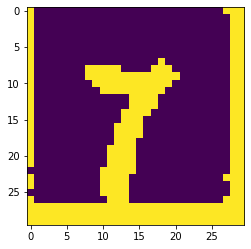

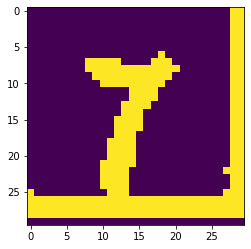

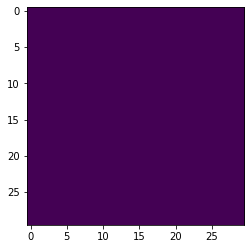

...

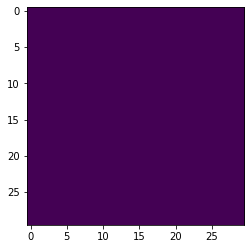

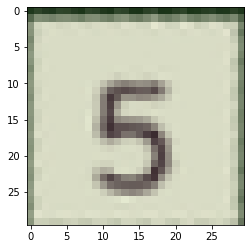

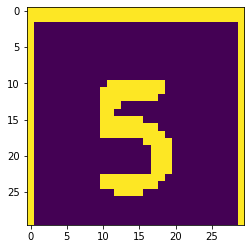

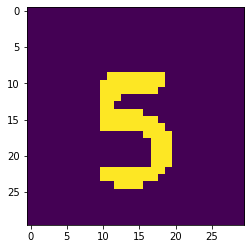

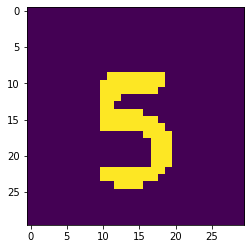

In [151]:
#Test go over cells
from google.colab.patches import cv2_imshow
path = "data/sample_test/4992.png"
image = get_image_formatted(path, demo = False, test = True)
cv2_imshow(image)
for i in range(81):
  cell = get_square(i, image)

  if is_empty(cell):
    continue
  print_img(cell)
  cell = cv2.cvtColor(cell, cv2.COLOR_BGR2GRAY)
  ret,cell = cv2.threshold(cell,160,255,cv2.THRESH_BINARY)
  cell = np.invert(cell)
  print_img(cell)
  cell = extract_digit(cell)
  cell = shift(cell,0, -1)
  print_img(cell)
  cell = clear_border(cell)

  
  print_img(cell)

# Use Pretrained Model to Read in Cell Data

In [152]:
import tensorflow as tf
import matplotlib.pyplot as plt
import seaborn as sn
import numpy as np
import pandas as pd
import math
import datetime
import platform

print('Python version:', platform.python_version())
print('Tensorflow version:', tf.__version__)
print('Keras version:', tf.keras.__version__)

Python version: 3.7.11
Tensorflow version: 1.15.2
Keras version: 2.2.4-tf


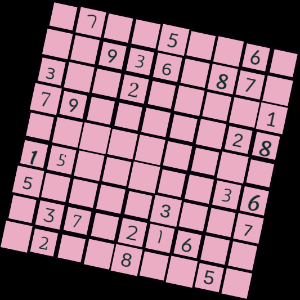

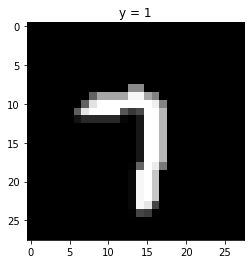

yhat: 7
probability of class  0.08406799286603928


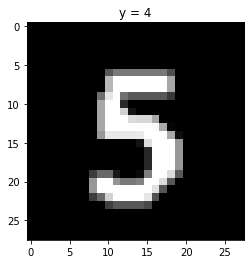

yhat: 5
probability of class  0.0835588276386261


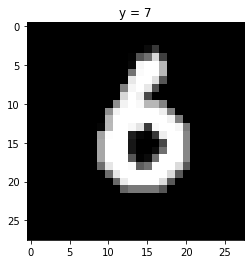

yhat: 6
probability of class  0.08251818269491196


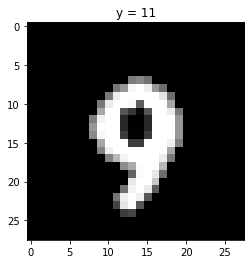

yhat: 9
probability of class  0.08376415073871613


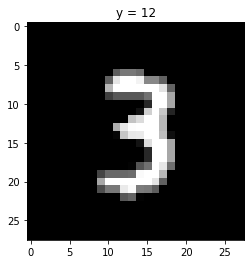

yhat: 3
probability of class  0.08392184972763062


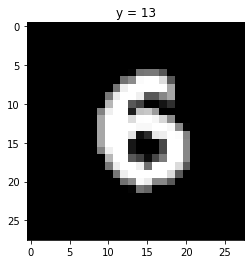

yhat: 6
probability of class  0.08120913803577423


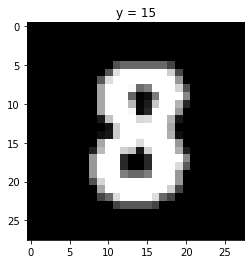

yhat: 8
probability of class  0.06922364979982376


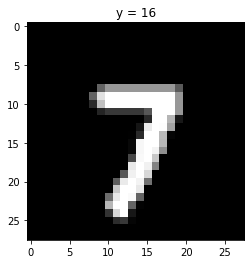

yhat: 7
probability of class  0.08668620139360428


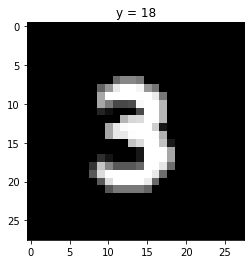

yhat: 3
probability of class  0.08226947486400604


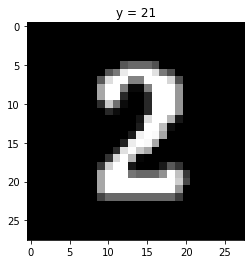

yhat: 2
probability of class  0.08404076844453812


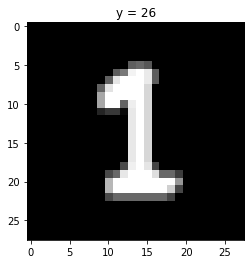

yhat: 1
probability of class  0.08357319235801697


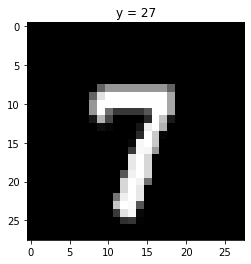

yhat: 7
probability of class  0.08732254058122635


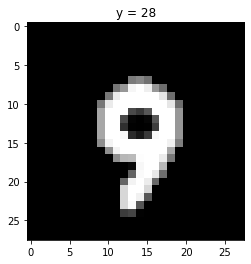

yhat: 9
probability of class  0.08492980152368546


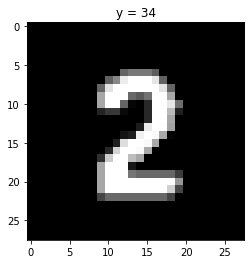

yhat: 2
probability of class  0.0835588201880455


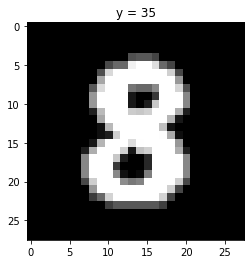

yhat: 8
probability of class  0.0743696540594101


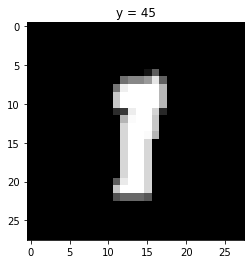

yhat: 1
probability of class  0.07975277304649353


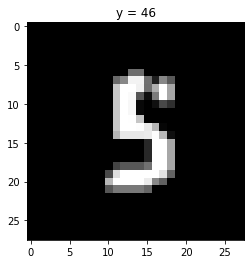

yhat: 5
probability of class  0.0835588201880455


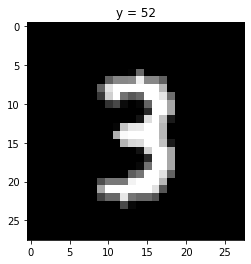

yhat: 3
probability of class  0.08384091407060623


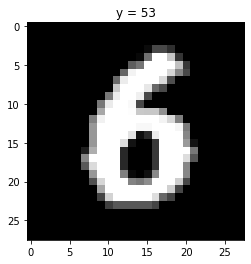

yhat: 6
probability of class  0.08132816106081009


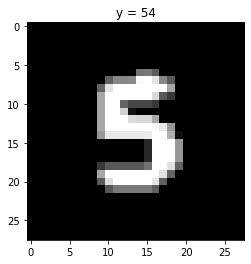

yhat: 5
probability of class  0.08067222684621811


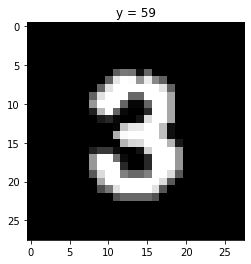

yhat: 3
probability of class  0.07964274287223816


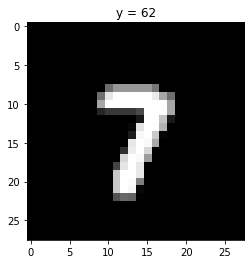

yhat: 7
probability of class  0.08346786350011826


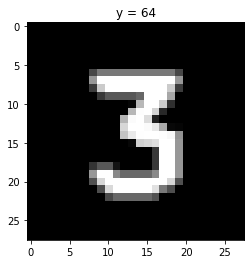

yhat: 3
probability of class  0.08366508036851883


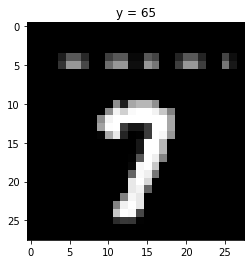

yhat: 7
probability of class  0.08400572836399078


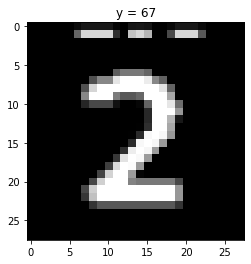

yhat: 2
probability of class  0.08346521854400635


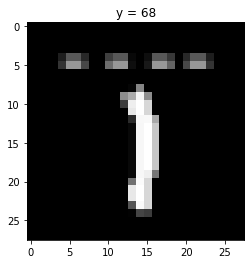

yhat: 1
probability of class  0.08492980152368546


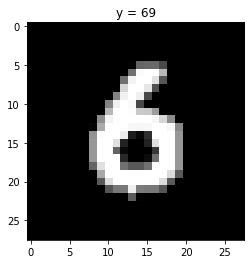

yhat: 6
probability of class  0.08027400821447372


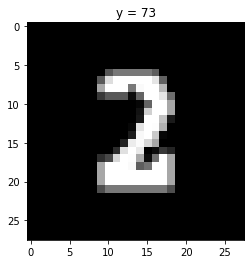

yhat: 2
probability of class  0.08312193304300308


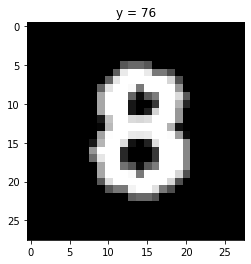

yhat: 8
probability of class  0.07458968460559845


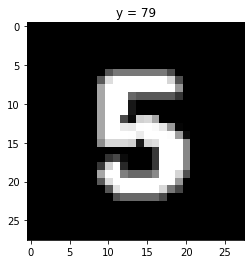

yhat: 5
probability of class  0.07971882075071335
145675719129737957612623576375
756936873217928153653737216285


'145675719129737957612623576375'

In [153]:
#Demo Image cleanup and show network predictions
import os
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from datetime import datetime
import torch
import torch.nn as nn
import torch.nn.functional as F
from torch.utils.data import DataLoader
from torchvision.utils import make_grid
from torchvision import models, transforms, datasets
from google.colab.patches import cv2_imshow
path = "data/sample_test/4997.png"
img=cv2.imread(path)
cv2_imshow(img)

image = get_image_formatted(path, demo = False, test = True)

part = transforms.Compose([transforms.ToPILImage(),transforms.Resize((28, 28))])

toImage =  transforms.Compose([transforms.ToTensor()])

Softmax_fn=nn.Softmax(dim=-1)

repr = '145675719129737957612623576375'

sol = ''

def clear_border1(cell):
  for i in range(28):
    c = 0
    for j in range(28): 
       if (cell[i][j] == 255):
         c += 1
    if c >= 24:      
       for j in range(28): 
          cell[i][j] = 0

def decouple(cell):
  for i in range(5,23):
    cell[27][i] = 0
  return cell


for i in range(81):
  cell = get_square(i, image)
  if is_empty(cell):
    continue
  #same format as format cell  
  cell = cv2.cvtColor(cell, cv2.COLOR_BGR2GRAY)
  ret,cell = cv2.threshold(cell,170,255,cv2.THRESH_BINARY)
  cell = np.invert(cell)
  cv2_imshow(cell)
  cv2_imshow(cell)
  clear_border1(cell)
  cell = decouple(cell)  
  cell = clear_border(cell)
  cv2_imshow(cell)
  shiftx, shifty = getBestShift(cell)
  cell = shift(cell, shiftx, shifty )
  cell = part(cell)
  cell = np.array(cell)
  cv2_imshow(cell)
  cell = Image.fromarray(cell)
  cell = toImage(cell)
  new = cell.reshape(1, 28, 28, 1)
  #same format as solve puzzle
  pred =  model.predict(new, batch_size=1)
  z = pred.argmax()
  yhat = z
  sol += str(z)  
  show_data((cell, i))
  plt.show()
  print("yhat:", yhat)
  print("probability of class ", torch.max(Softmax_fn(cell)).item())
print(repr)    
print(sol)

'145675719129737957612623576375'

# Read and Solve Sudoku Puzzle

In [154]:
def format_cell(cell):
  part = transforms.Compose([transforms.ToPILImage(),transforms.Resize((28, 28))])
  toImage =  transforms.Compose([transforms.ToTensor()])
  #Binarize the image
  cell = cv2.cvtColor(cell, cv2.COLOR_BGR2GRAY)
  ret,cell = cv2.threshold(cell,140,255,cv2.THRESH_BINARY)
  cell = np.invert(cell)

  #clear border preprocessing
  clear_border1(cell)
  cell = decouple(cell) 

  #Removes all pixels touching the border
  cell = clear_border(cell)
  
  #Shift image to center of screen
  shiftx, shifty = getBestShift(cell)
  cell = shift(cell, shiftx, shifty )
  
  #format to NN predict
  cell = part(cell)
  cell = np.array(cell)
  cell = Image.fromarray(cell)
  cell = toImage(cell)
  new = cell.reshape(1, 28, 28, 1)
  return new

In [155]:
def get_solution(path, model, sol):
  plt.imshow(plt.imread(path)) 
  #straighten
  image_formatted = get_image_formatted(path, demo = False, test = True)  
  representation = ''  

  #Iterate over each cell
  for j in range(81):        
      #Get individual square
      cell = get_square(j, image_formatted)           
      #check if empty square
      if is_empty(cell):
        representation += '_'
      else: 
        #process image to be inputed into network
        cell = format_cell(cell)
        #predicition
        pred = model.predict(cell, batch_size=1)
        
        #Add to row major form
        answer = str(pred.argmax())
        representation += answer  
  #Solve Puzzle
  our_sol = findSolution(representation)

  print("our representation:", representation)  
  print("our solution:      ", our_sol)
  print("solution:          ", sol)
  #Verify Solution
  if our_sol == sol:
    print("Correct!")
    return 1
  print("Inccorect")  
  return 0  

our representation: _7__5__6___936_87_3__2____179_____28_________15_____365____3__7_37_216___2__8__5_
our solution:       874159362219364875365278941793416528642835719158792436581643297937521684426987153
solution:           874159362219364875365278941793416528642835719158792436581643297937521684426987153
Correct!


1

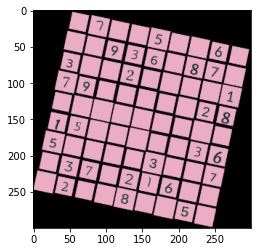

In [156]:
#Demo get_solution
get_solution("data/sample_test/4997.png",model, "874159362219364875365278941793416528642835719158792436581643297937521684426987153")

In [157]:
#Run solver for range of test images
def NN_sample_test(num1, num2):
  board_dataset = []
  dir = 'data/demo_test/' 
  labels = pd.read_csv('data/demo_test/labels.csv')
  correct = 0
  for i in range(num1, num2):
    name = str(i)
    length = len(name)
    if length < 4:      
      zero_pad = '0' * (4 - length)
      name = zero_pad + name
    name = dir + "Copy of " + name + ".png"
    img=cv2.imread(name)
    cv2_imshow(img)
    print(name)
    sol = labels['solution'][i]
    correct += get_solution(name, model, sol)
  print("acc score =", correct / (num2 - num1))  

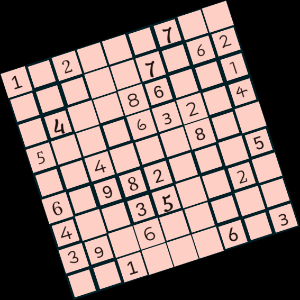

data/demo_test/Copy of 4901.png
our representation: 1_2___1_______7_62_4__86__15___632_4__4___8__6_982___54__35__2_39_6_______1___6_3
our solution:       no solution
solution:           162435789853197462947286531518763294234519876679824315486351927395672148721948653
Inccorect
acc score = 0.0


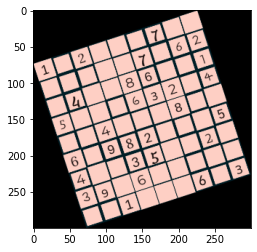

In [158]:
NN_sample_test(4901, 4902)

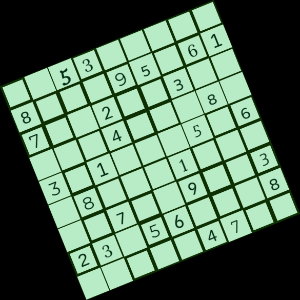

data/demo_test/Copy of 4900.png
our representation: __53_____8___95_617__2__3_____4___8_3_1___5_6_8___1_____7__9__323_56___8_____27__
our solution:       945316872823795461716284395562473189371928546489651237157849623234567918698132754
solution:           495316827823795461716248395672453189341982576589671234157829643234567918968134752
Inccorect


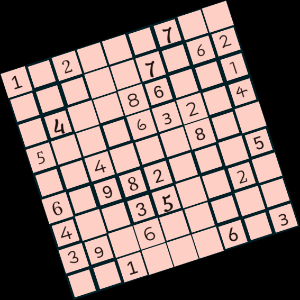

data/demo_test/Copy of 4901.png
our representation: 1_2___1_______7_62_4__86__15___632_4__4___8__6_982___54__35__2_39_6_______1___6_3
our solution:       no solution
solution:           162435789853197462947286531518763294234519876679824315486351927395672148721948653
Inccorect


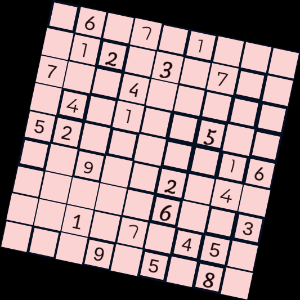

data/demo_test/Copy of 4902.png
our representation: _6_7_1____12_3_7__7__4______4_1__5__52_____16__9__2_4______6__3__1_7_25____9_5_8_
our solution:       965721438412538769738469125346187592527394816189652347854216973691873254273945681
solution:           968751234412638795735429168346187529527394816189562347854216973691873452273945681
Inccorect


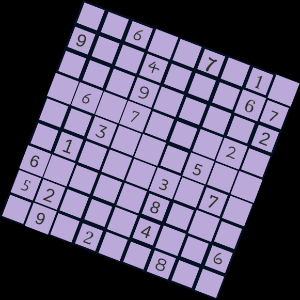

data/demo_test/Copy of 4903.png
our representation: __6__7_1_9__4___67___9____2_6_7___2___3___5___1___3_7_6____8___52___4__6_9_2__8__
our solution:       486327915952481367137965482865749123743612598219853674671538249528194736394276851
solution:           486327915952481367137965482865749123743612598219853674671538249528194736394276851
Correct!


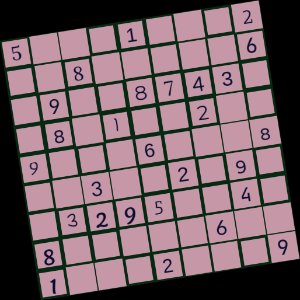

data/demo_test/Copy of 4904.png
our representation: 5___1___2__8_____6_9__8743__8_1__2__9___6___8__3__2_9__3295__4_8_____6__1___2___9
our solution:       576413982348295176291687435485139267927564318613872594732956841859741623164328759
solution:           576413982348295176291687435485139267927564318613872594732956841859741623164328759
Correct!


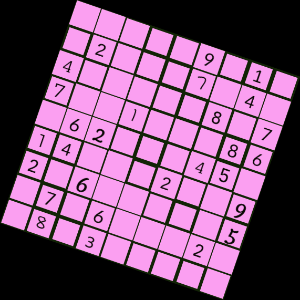

data/demo_test/Copy of 4905.png
our representation: _____9_1__2___7_4_4_____8_77__1___86_62___45_14___2__92_6_____5_7_6___2__8_3_____
our solution:       637489512928517643451236897793154286862973451145862379216748935374695128589321764
solution:           637489512928517643451236897793154286862973451145862379216748935374695128589321764
Correct!


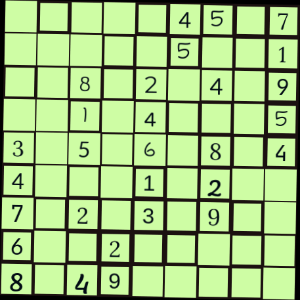

data/demo_test/Copy of 4906.png


/usr/local/lib/python3.7/dist-packages/scipy/ndimage/measurements.py:1359: RuntimeWarning: invalid value encountered in double_scalars
  for dir in range(input.ndim)]


our representation: 111115171__1111111__511115111914111111116_11111112151117111111_16_11111_18_411111
our solution:       111115171421111111635111151119141111111163111111121511171111113163111112182411111
solution:           123694587946875321578123469261348795395762814487519236712436958659287143834951672
Inccorect


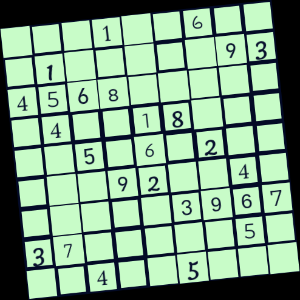

data/demo_test/Copy of 4907.png
our representation: ___1__6___1_____934568______4__18_____5_6_2_____92__4______396737_____5___4__5___
our solution:       937152684812746593456839721249518376785364219163927845521483967378691452694275138
solution:           937152684812746593456839721249518376785364219163927845521483967378691452694275138
Correct!


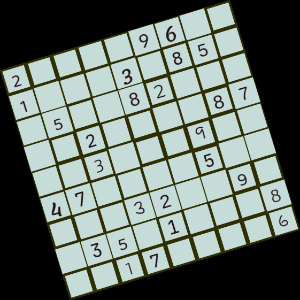

data/demo_test/Copy of 4908.png
our representation: 2____96__9___3_85__5__82_____2____87__3___9__47____5_____32__9__35_1___8__17____6
our solution:       no solution
solution:           287549613194637852356182749562491387813275964479863521748326195635914278921758436
Inccorect


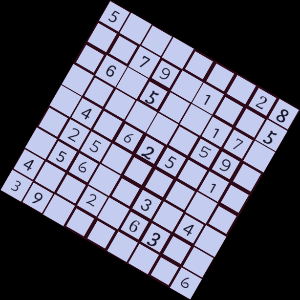

data/demo_test/Copy of 4909.png
our representation: 5______28__79_1__5_6_5__97_______59__4_625_9__25_______56__3_4_4__2_63__39______6
our solution:       no solution
solution:           514367928287941635963582174638174592749625813125839467856793241471256389392418756
Inccorect


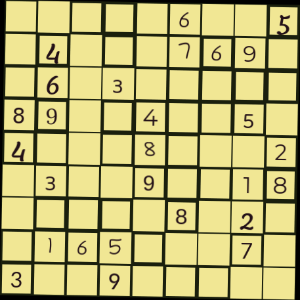

data/demo_test/Copy of 4910.png
our representation: 111111_11__11169_1_1151111115114111115118_15111119115111113117_11911111_13_111111
our solution:       111111211421116931311511111151141111151182151111191151111131172119111113132111111
solution:           729416385543827691168359247891243756457681932632795418974168523216534879385972164
Inccorect


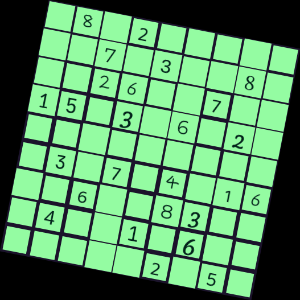

data/demo_test/Copy of 4911.png
our representation: _8_2_______7_3__8___26__7__15_3_6_2___________3_7_4_96__6__83___4__1_6_______2_5_
our solution:       381247569567139284492685713154396827679821435238754196926578341845913672713462958
solution:           583247169697135284412689735158396427764821593239754816926578341845913672371462958
Inccorect


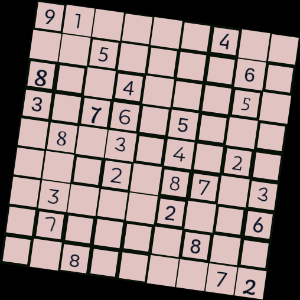

data/demo_test/Copy of 4912.png
our representation: 91____4____5____6_8__4___5_3_76_5____8_3_4_2____2_87_3_3___2__6_7____8____8____72
our solution:       912567438745831269863429157327615984189374625654298713431782596276953841598146372
solution:           912567438745831269863429157327615984189374625654298713431782596276953841598146372
Correct!


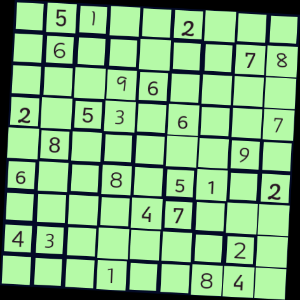

data/demo_test/Copy of 4913.png
our representation: _51__2____6_____78___96____2_53_6__7_8_____9_6__8_59_2____47___43_____2____1__84_
our solution:       no solution
solution:           851732964963451278742968513215396487387214695694875132128647359436589721579123846
Inccorect


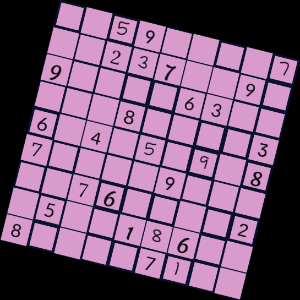

data/demo_test/Copy of 4914.png
our representation: __59____7__237__9_9____63_____8____36_4_5_9_87____9_____76____2_5__186__8____71__
our solution:       385941267462375891971286345519864723634752918728139456147693582253418679896527134
solution:           385941267462375891971286345519864723634752918728139456147693582253418679896527134
Correct!


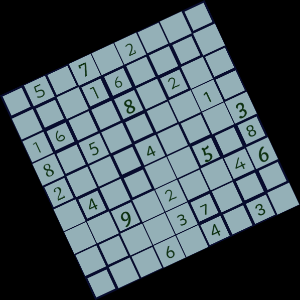

data/demo_test/Copy of 4915.png
our representation: _5_7_2______16____16__8_2__8_5____1_2___4___3_4____5_8__9_2__46____37______6_4_3_
our solution:       358792164924165387167483259895376412271548693643219578539821746416937825782654931
solution:           358792164924165387167483259895376412271548693643219578539821746416937825782654931
Correct!


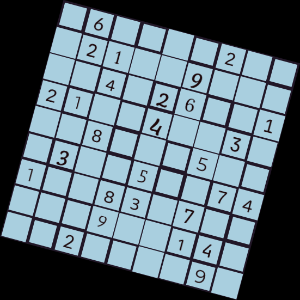

data/demo_test/Copy of 4916.png
our representation: _6____2___21__9_____4_26__121__4__3___8___5___3__5__741__83_7_____9__94___2____9_
our solution:       no solution
solution:           863417259521389467974526381215748936748693512639251874196834725357962148482175693
Inccorect


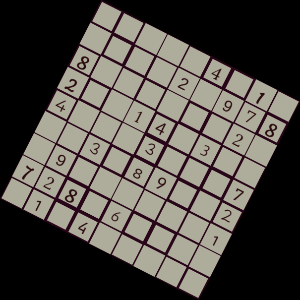

data/demo_test/Copy of 4917.png
our representation: _____4_1_____2_9788______2_2__14_3__4___3___7__3_89__2_8______1728_6_____1_4_____
our solution:       no solution
solution:           952874613146523978837916524289147365461235897573689142694758231728361459315492786
Inccorect


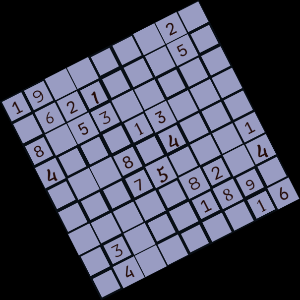

data/demo_test/Copy of 4918.png
our representation: 19_____2__621___5_8_53_____4___13______8_4______75___1_____82_4_3___189__4_____16
our solution:       194587623362149758875362149487913562651824937923756481519638274236471895748295316
solution:           194587623362149758875362149487913562651824937923756481519638274236471895748295316
Correct!


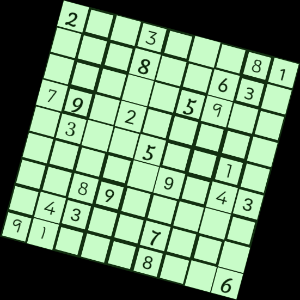

data/demo_test/Copy of 4919.png
our representation: 2__3___89___8__63______59__79_2______3__5__1______9_43__89______43__7___91___8__6
our solution:       no solution
solution:           259376481471892635386145927794231568832654719165789243528963174643517892917428356
Inccorect


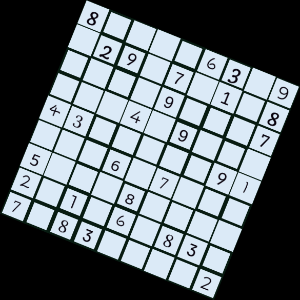

data/demo_test/Copy of 4920.png
our representation: 8____63_9_29_7_1_8____9___7___4_9___43_____91___6_7___5___8____2_1_6_83_7_83____2
our solution:       875126349329574168614893527186439275437258691952617483543982716291765834768341952
solution:           875126349329574168614893527186439275437258691952617483543982716291765834768341952
Correct!


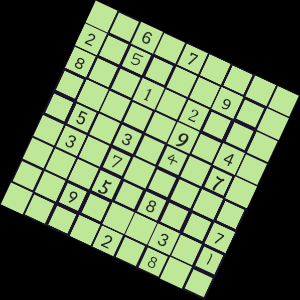

data/demo_test/Copy of 4921.png
our representation: __6_7____2_5___9__8__1_2________9_4__5_3_4_7__3_7________5_8__7__9___3_1____2_8__
our solution:       196875432275436918843192765768259143951384276432761589324518697589647321617923854
solution:           196875432275436918843192765768259143951384276432761589324518697589647321617923854
Correct!


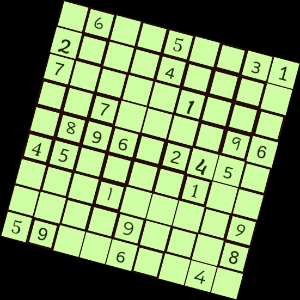

data/demo_test/Copy of 4922.png
our representation: _6__5__312___4____7____1_____7____96_896_245_45____1_____1____9____9___859__6__4_
our solution:       964857231218346975735921864127584396389612457456739182843175629672493518591268743
solution:           964857231218346975735921864127584396389612457456739182843175629672493518591268743
Correct!


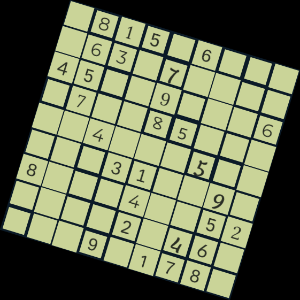

data/demo_test/Copy of 4923.png
our representation: _815_6____63_7____45__9___6_7__85_____4___5_____31__9_8___4__52____2_46____9_978_
our solution:       no solution
solution:           781536249963472815452198376679285134134769528528314697817643952395827461246951783
Inccorect


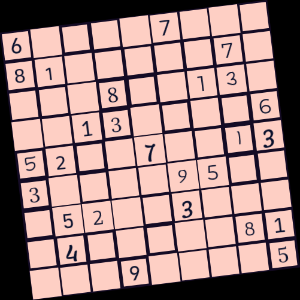

data/demo_test/Copy of 4924.png
our representation: 6____7___89_____7____8__13___13____652__7__133____95___52__3____4_____81___9____5
our solution:       613297854894531672275864139481325796529678413367149528152483967946752381738916245
solution:           634197852819532674275864139491358726528476913367219548152683497946725381783941265
Inccorect


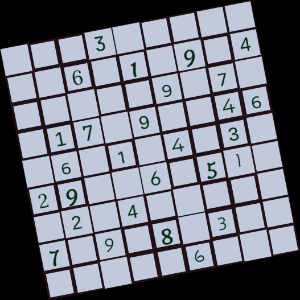

data/demo_test/Copy of 4925.png
our representation: ___3_______6_1_9_4_____9_7__17_9__46_6_1_4_3_29__6_51__2_4_____7_9_8_3_______6___
our solution:       971348652536217984482659173317895246865124739294763518623471895749582361158936427
solution:           971348652536217984482659173317895246865124739294763518623471895749582361158936427
Correct!


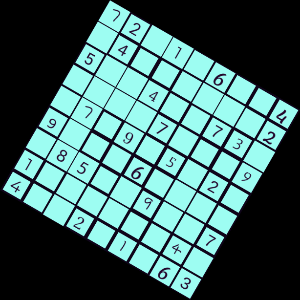

data/demo_test/Copy of 4926.png
our representation: 72_1_6__4_4______25__4__73_____7___4_7_4_5_2_9___6_____85__9__71______4_4__2_1_63
our solution:       no solution
solution:           723196584846537192519428736231874659674915328958362471385649217162783945497251863
Inccorect


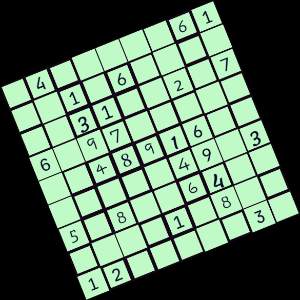

data/demo_test/Copy of 4927.png
our representation: _4_____61__1_6______31__2_76_97_______48916_______49_35_8__64______1_8__12_____3_
our solution:       745928361281367594963145287659732148374891652812654973538276419497513826126489735
solution:           745928361281367594963145287659732148374891652812654973538276419497513826126489735
Correct!


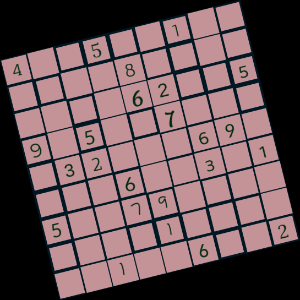

data/demo_test/Copy of 4928.png
our representation: 4__5__1______8________62__59_5__7____32___69____6__3_15__79________1______1__6__2
our solution:       486573129259481763317962845965137284132854697748629351523798416674215938891346572
solution:           486573129259481763317962845965137284132854697748629351523798416674215938891346572
Correct!


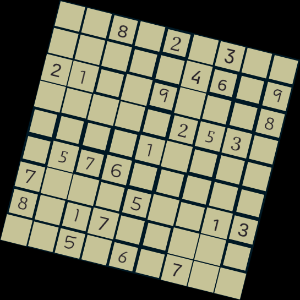

data/demo_test/Copy of 4929.png
our representation: __8_2_3_______46_929__9___8_____253_____1_____576_____7___5__138_17_______5_6_7__
our solution:       no solution
solution:           948526371573184629216397458189472536632915847457638192764859213821743965395261784
Inccorect


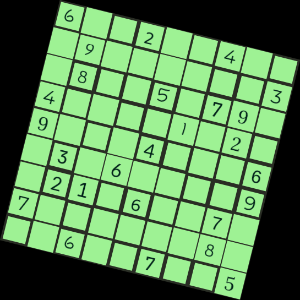

data/demo_test/Copy of 4930.png
our representation: 6__3__4___9______3_8__5_79_4____1_2_9___4___6_3_6____9_21_6__7_7______8___6__7__5
our solution:       617329458594718263283456791465981327972543816138672549321865974759134682846297135
solution:           675239418294178563183456792468591327912743856537682149321865974759324681846917235
Inccorect


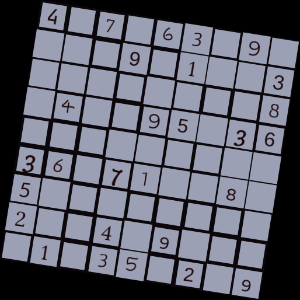

data/demo_test/Copy of 4931.png
our representation: 4_7_63_9____9_1__3________8_4__95_36_________36_71__8_5________2__4_9____1_35_2_9
our solution:       427863195685971423931542678148295736752638914369714582593126847276489351814357269
solution:           427863195685971423931542678148295736752638914369714582593126847276489351814357269
Correct!


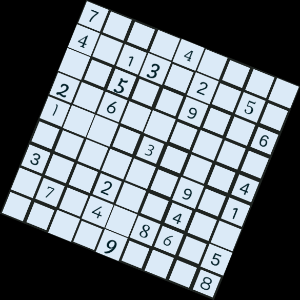

data/demo_test/Copy of 4932.png
our representation: 7___4____4_93_2_5___5__9__62_6______1___3___4______9_93__2__4___7_4_86_5____9___8
our solution:       no solution
solution:           793546182461382759825179346246951873189637524537824961318265497972418635654793218
Inccorect


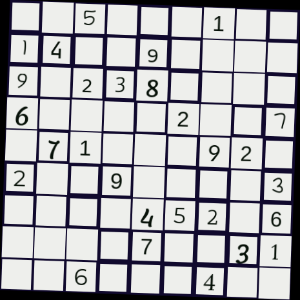

data/demo_test/Copy of 4933.png
our representation: 115___1_1941_9____9_238____5____2__1_71___92_2__9____11___452_61__17__311161__4__
our solution:       no solution
solution:           835724169147596382962381754659132847371468925284957613713845296428679531596213478
Inccorect


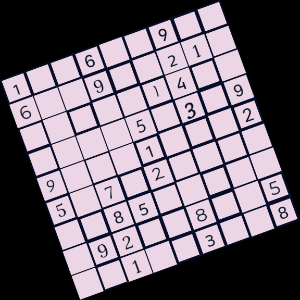

data/demo_test/Copy of 4934.png
our representation: 9__6__9__6__9__21______14______5_3_99___7___25_7_2______85______92__8__5__1__3__8
our solution:       no solution
solution:           125647983634985217879231456216854379983716542547329861368572194492168735751493628
Inccorect


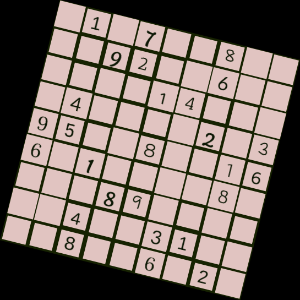

data/demo_test/Copy of 4935.png
our representation: _1_7__8____92__6______94____4____2_395__8__166_1____8____89______4__31____8__6_2_
our solution:       no solution
solution:           216739845479258631385614972847961253953482716621375489132897564764523198598146327
Inccorect


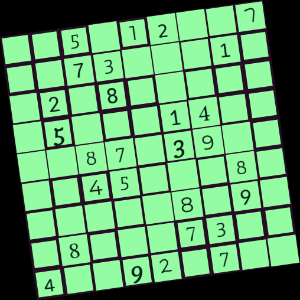

data/demo_test/Copy of 4936.png
our representation: __5_12__7__73___1__2_8______5___14____87_39____45___8______8_9__8___73__4__92_7__
our solution:       395612847847359612126874539953281476268743951714596283672438195589167324431925768
solution:           395612847847359612126874539953281476268743951714596283672438195589167324431925768
Correct!


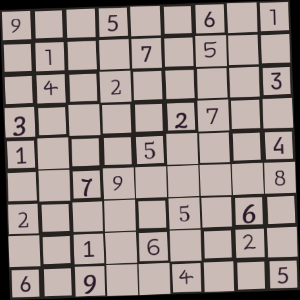

data/demo_test/Copy of 4937.png
our representation: 9115_1619111_7_5111453____33____27_11___5___4__79____82____5_6___1_6__2_1_9__4__1
our solution:       no solution
solution:           972583641813476592546219873395842716128657934467931258284195367751368429639724185
Inccorect


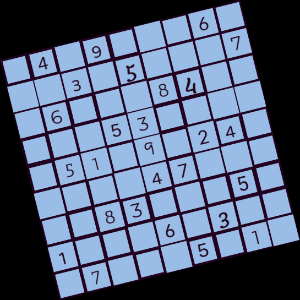

data/demo_test/Copy of 4938.png
our representation: _4_9___6___3_5___7_6___84_____53_____59_9_24_____47_____83___5_1___6_3___7___5_1_
our solution:       no solution
solution:           847923165913654827562718439684532791751896243239147586498371652125469378376285914
Inccorect


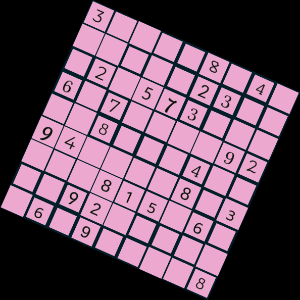

data/demo_test/Copy of 4939.png
our representation: 3____8_4______23___2_573___6_7____92__8___4__94____8_3___815_6___92______6_9____8
our solution:       395168247716492385824573619657384192138729456942651873273815964589246731461937528
solution:           395168247716492385824573619657384192138729456942651873273815964589246731461937528
Correct!


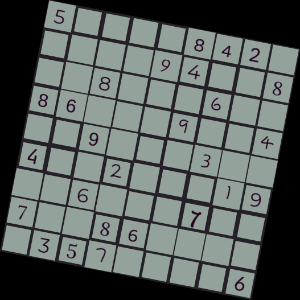

data/demo_test/Copy of 4940.png
our representation: 5____842_____94__8__8___6__89___9__4__9___3__4__2___19__6___7__7__86_____357____6
our solution:       no solution
solution:           591638427627594138348127695862319574179485362453276819286953741714862953935741286
Inccorect


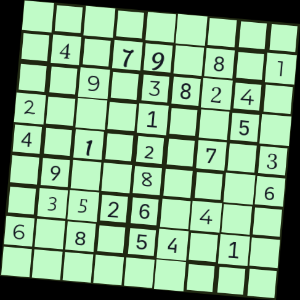

data/demo_test/Copy of 4941.png
our representation: __________4_79_8_7__9_3824_2___1__5_4_1_2_7_3_9__8___6_3526_4__6_8_54_1__________
our solution:       no solution
solution:           813542697542796831769138245286317954451629783397485126935261478678954312124873569
Inccorect


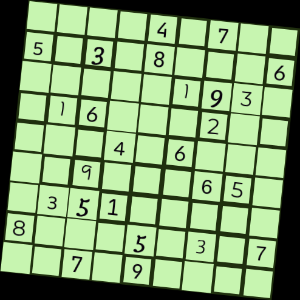

data/demo_test/Copy of 4942.png
our representation: ____4_7__5_3_8___6_____193__16___2_____4_6_____9___65__351_____8___5_3_7__7_9____
our solution:       162349785593782416784561932316975248258436179479218653935127864821654397647893521
solution:           162349785593782416784561932316975248258436179479218653935127864821654397647893521
Correct!


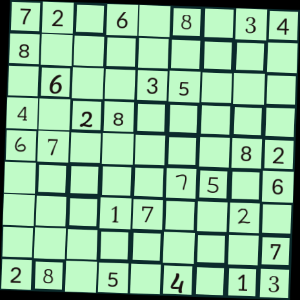

data/demo_test/Copy of 4943.png
our representation: 7216_8_342________15__35___4_28_____67_____82_____75_6___17__2_1_______728_5_4_13
our solution:       no solution
solution:           725618934831749265964235178452863791679451382318927546543176829196382457287594613
Inccorect


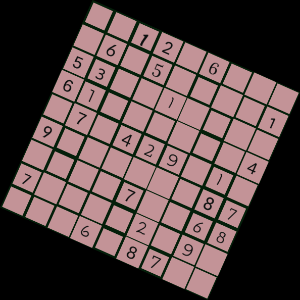

data/demo_test/Copy of 4944.png
our representation: __12_6____6_5____153__1____01______4_7_429_1_9______87____7__687____2_9____6_87__
our solution:       841296375269537841537814629612785934378429516954361287425973168786152493193648752
solution:           841296375269537841537814629612785934378429516954361287425973168786152493193648752
Correct!


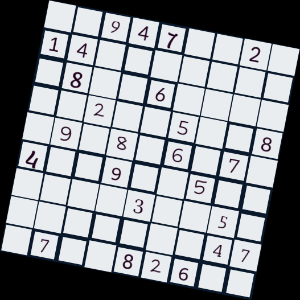

data/demo_test/Copy of 4945.png
our representation: __447__2_14________8__6______2__5__8_9_8_6_7_4__9__5______3__5________47_7__826__
our solution:       no solution
solution:           659478123143259786287163495762345918591826374438917562816734259325691847974582631
Inccorect


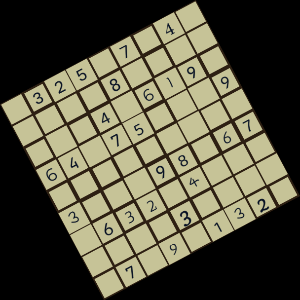

data/demo_test/Copy of 4946.png
our representation: _325_7_4_____8_______4_619_64_75___9_________3___98_67_632_4_______3_____7_9_132_
our solution:       932517648416389572857426193641752839789643251325198467163274985294835716578961324
solution:           932517648416389572857426193641752839789643251325198467163274985294835716578961324
Correct!


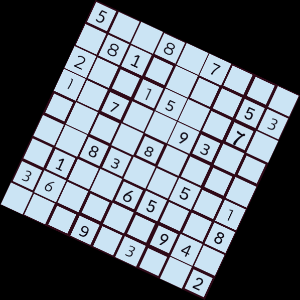

data/demo_test/Copy of 4947.png
our representation: 5__8_7____81____532__95__7_1_7__93______8______83__5_1_1__65__836____94____9_3__2
our solution:       no solution
solution:           596837214781492653234156879147529386953681427628374591419265738362718945875943162
Inccorect


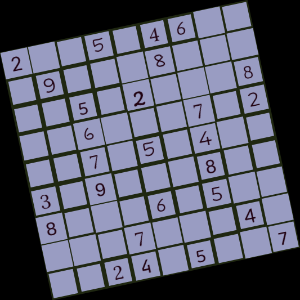

data/demo_test/Copy of 4948.png
our representation: 2__5_46___9___8_____5_2___8__6___7_2__7_5_4__3_9___8__8___6_5_____7___4___24_5__7
our solution:       238594671691378254745126398456819732187253469329647815874961523513782946962435187
solution:           238594671691378254745126398456819732187253469329647815874961523513782946962435187
Correct!


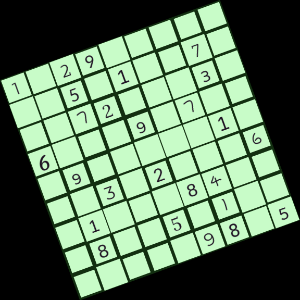

data/demo_test/Copy of 4949.png
our representation: 1_39_______5_1__7___72___3_6___9_7___9_____1___3_2___6_1___84___8__5_1_______98_5
our solution:       no solution
solution:           132967548865314279947285631621893754798546312453721986519678423386452197274139865
Inccorect


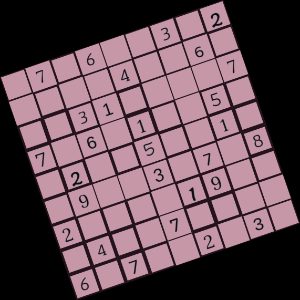

data/demo_test/Copy of 4950.png
our representation: _7_6__3_2____4__6___31____77_6_1__5__2__5__1__8__3_7_82____89___4__7____6_7__2_3_
our solution:       no solution
solution:           471685392982743561563129487736814259824957613195236748258361974349578126617492835
Inccorect


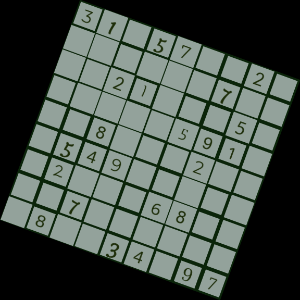

data/demo_test/Copy of 4951.png
our representation: 31_57__2_______7____21___5______581___8___2___549______2___68____7_______8__34_97
our solution:       no solution
solution:           316578429895462731742193658273685914968341275154927386529716843437859162681234597
Inccorect


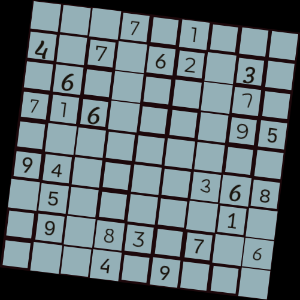

data/demo_test/Copy of 4952.png
our representation: ___7_7___4_7_62_3__6_____7_796____95_________94____368_5_____1__9_83_7_6___4_9___
our solution:       no solution
solution:           325741689487962531169583274716328495538694127942157368854276913291835746673419852
Inccorect


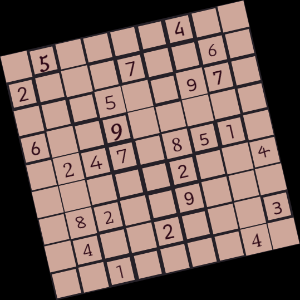

data/demo_test/Copy of 4953.png
our representation: _5____4__2___7__6____5__97_6__9______247_857______2__4_83__9____4__2___3__9____4_
our solution:       no solution
solution:           157296438298374165436581972613945827924738516875612394382469751549127683761853249
Inccorect


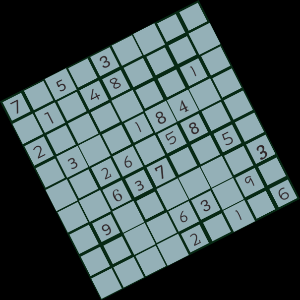

data/demo_test/Copy of 4954.png
our representation: 7_5_3_____7_48____2______1__3__184____26_58____637__5__9______3____63_9_____2_1_6
our solution:       no solution
solution:           765139248913482675248756319539218467472695831186374952697841523821563794354927186
Inccorect


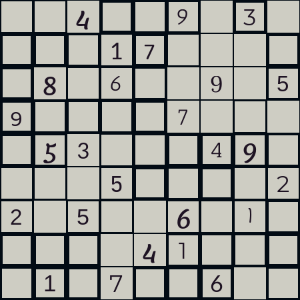

data/demo_test/Copy of 4955.png
our representation: __4__9_3____17_____8_6__9_59____7____53___49____5____22_5__6_1_____41____1_7__6__
our solution:       574829136396175248182634975928467351653218497741593862235986714867341529419752683
solution:           574829136396175248182634975928467351653218497741593862235986714867341529419752683
Correct!


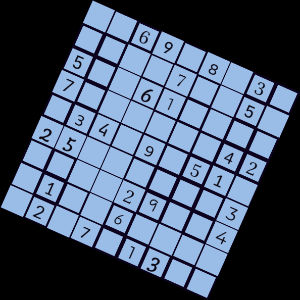

data/demo_test/Copy of 4956.png
our representation: __69_8_3_____7__5_5__61____7______22_34_9_51_25______3____29__4_1__6_____2_7_73__
our solution:       no solution
solution:           146958237398472651572613498761835942834297516259146783683529174917364825425781369
Inccorect


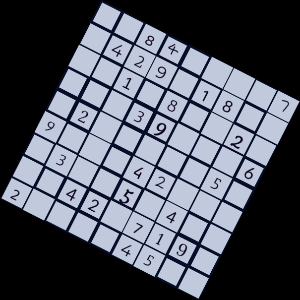

data/demo_test/Copy of 4957.png
our representation: __84____7_429_18____1_8__2____39___6_2_____5_9___42____3__5_4____42_719_2____45__
our solution:       358426917642971835791583624817395246423618759965742381136859472584267193279134568
solution:           358426917642971835791583624817395246423618759965742381136859472584267193279134568
Correct!


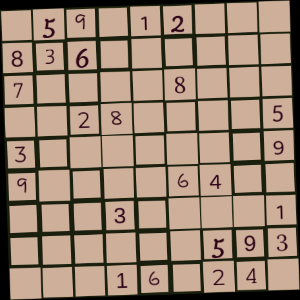

data/demo_test/Copy of 4958.png
our representation: 1191151118361_1111711__8_111_28___151______191____64_11__3____91_____19111_16_111
our solution:       no solution
solution:           459712386836945127721638954642893715375421869918576432284359671167284593593167248
Inccorect


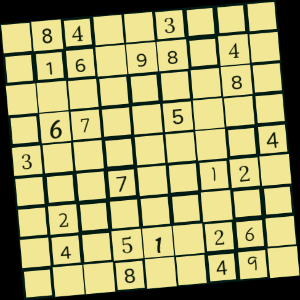

data/demo_test/Copy of 4959.png
our representation: _84__3____96_98_4________8__67__5___3_______4___7__12__2________4_51_26____8__49_
our solution:       no solution
solution:           984673512516298347273154986167425839352981674498736125621349758849517263735862491
Inccorect


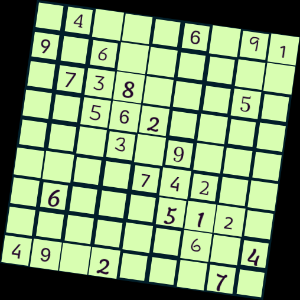

data/demo_test/Copy of 4960.png
our representation: _4___6_999_6_______738___5___562_______3_9_______742___6___513_______6_449_2___7_
our solution:       no solution
solution:           248536791956741382173892456715628943624359817839174265367485129582917634491263578
Inccorect


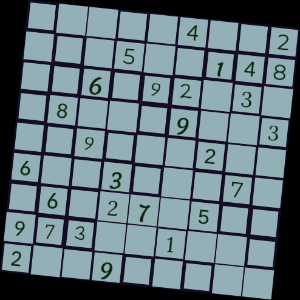

data/demo_test/Copy of 4961.png
our representation: _____4__2___5__148__6_92_3__8___9__3__9___2__6__3___7__6_27_5__973__1___2__9_____
our solution:       517834962392567148846192735481729653739645281625318479168273594973451826254986317
solution:           517834962392567148846192735481729653739645281625318479168273594973451826254986317
Correct!


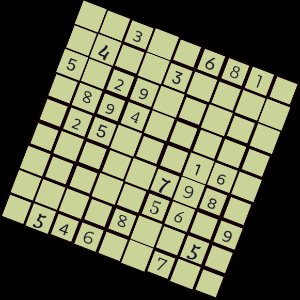

data/demo_test/Copy of 4962.png
our representation: __3__681__4__3____5_29______894______25___96______798______56_9____8__5__546__7__
our solution:       no solution
solution:           973546812841732596562918473789461325425893167316257984238175649697384251154629738
Inccorect


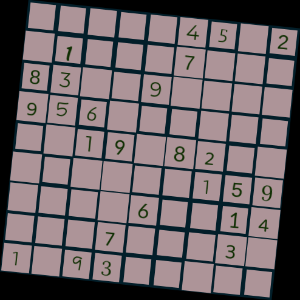

data/demo_test/Copy of 4963.png
our representation: _____45_2_1___7___83__9____956________19_82________959____6__14___7___3_1_93_____
our solution:       no solution
solution:           697134582214587396835692471956213847741958263382476159523869714468721935179345628
Inccorect


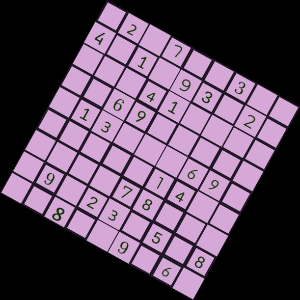

data/demo_test/Copy of 4964.png
our representation: _2_7__3__4_1_93_2____41______69______13___69______14______78____9_23_5_8__8__9_6_
our solution:       629785314471693825385412976846927153713854692952361487564178239197236548238549761
solution:           629785314471693825385412976846927153713854692952361487564178239197236548238549761
Correct!


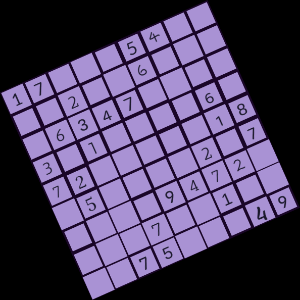

data/demo_test/Copy of 4965.png
our representation: 17___54____2__6____6347____3_1____6_72_____18_5____2_7____9472____7__1____75___49
our solution:       178325496542986371963471852381257964729643518654819237836194725495762183217538649
solution:           178325496542986371963471852381257964729643518654819237836194725495762183217538649
Correct!


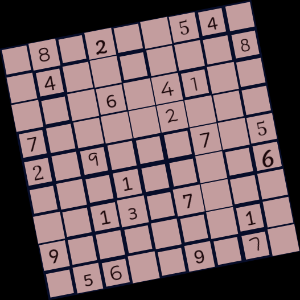

data/demo_test/Copy of 4966.png
our representation: _8_2__54__4______8___6_41__7____2___2_9___7_5___1____8__13_7___9______1__56__8_7_
our solution:       no solution
solution:           687291543142735968395684127768952431219463785534178296821347659973526814456819372
Inccorect


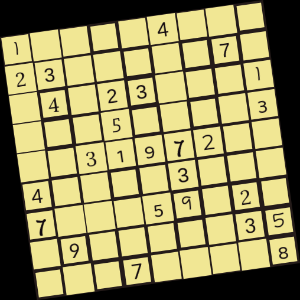

data/demo_test/Copy of 4967.png
our representation: 1____4___23_____7__4_23___1___5____3__31972__4____3___7___59_2__9_____35___7____8
our solution:       158974362236815479947236851879542613563197284412683597784359126691428735325761948
solution:           158974362236815479947236851879542613563197284412683597784359126691428735325761948
Correct!


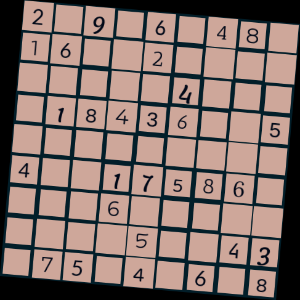

data/demo_test/Copy of 4968.png
our representation: 2_9_6_48_16__2_________4____18436__5_________4__17586____6_________5__43_75_4_6_8
our solution:       239567481164829537587314926918436275756982314423175869841693752692758143375241698
solution:           239567481164829537587314926918436275756982314423175869841693752692758143375241698
Correct!


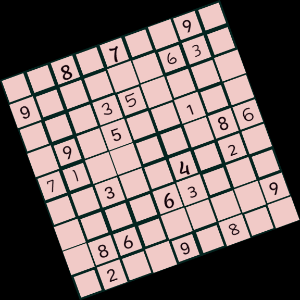

data/demo_test/Copy of 4969.png
our representation: __8_7__9_9_____63____35_____9_5__9__71_____86__3__4_2_____63____86_____9_2__9_8__
our solution:       no solution
solution:           238671594951248637674359218492586173715932486863714925149863752586127349327495861
Inccorect


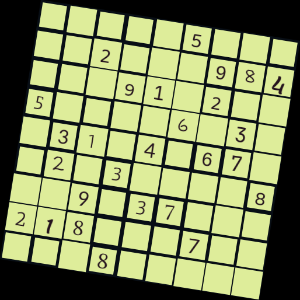

data/demo_test/Copy of 4970.png
our representation: _____5_____3___984___91_2__5____6_3__31_4_67__2_3____8__9_37___218___7_____8_____
our solution:       792485316153762984864913257587296431931548672426371598649137825218659743375824169
solution:           497285316152673984863914257584726139931548672726391548649137825218459763375862491
Inccorect


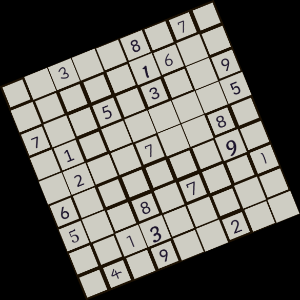

data/demo_test/Copy of 4971.png
our representation: __3__8_7______16__7__5_3__9_1______5_2__7__8_6______9_5__8_7__1__13______4_9__2__
our solution:       193468572254791638786523419319684725425179386678235194532847961961352847847916253
solution:           193468572254791638786523419319684725425179386678235194532847961961352847847916253
Correct!


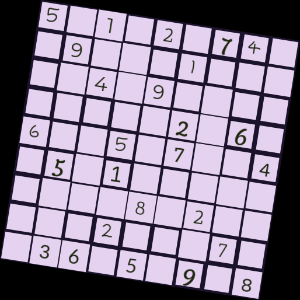

data/demo_test/Copy of 4972.png
our representation: 5_1_2_74__9___1_____4_9_________2_6_6__5_7__4_5_1_________8_2_____2___7__36_5_9_8
our solution:       561328749893471652724695183379842561612537894458169327147986235985213476236754918
solution:           561328749893471652724695183379842561612537894458169327147986235985213476236754918
Correct!


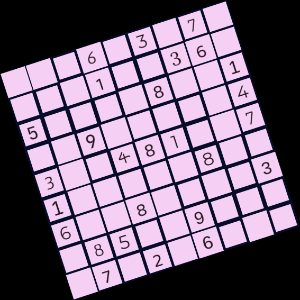

data/demo_test/Copy of 4973.png
our representation: ___6_3_7____9__36_5____8__1__9_____43__481__71_____8__6__8____3_85__9____7_2_6___
our solution:       no solution
solution:           218643579794125368536978241859367124362481957147592836621854793485739612973216485
Inccorect


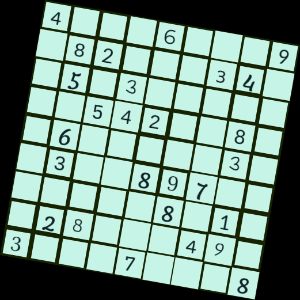

data/demo_test/Copy of 4974.png
our representation: 4___6___9_82___34__5_3_______542__8__6_____3__3__897_______8_1__28___49_3___7___8
our solution:       413865279682917345759342861975423186864751932231689754547298613128536497396174528
solution:           413865279682917345759342861975423186864751932231689754547298613128536497396174528
Correct!


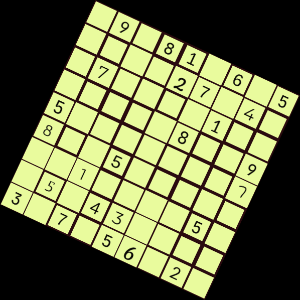

data/demo_test/Copy of 4975.png
our representation: _9_81_6_5____27_4__7____1_______8__95_______78__5_______9____5__5_43____3_7_56_2_
our solution:       no solution
solution:           293814675165927843478365192716248539534691287829573461941782356652439718387156924
Inccorect


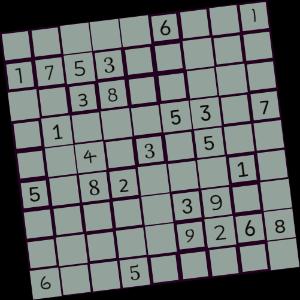

data/demo_test/Copy of 4976.png
our representation: _____6__11753_______38______1___53_7__4_3_5__5_82___1______39_______92686__5_____
our solution:       982756431175394826463812795216985347794631582538247619827163954351479268649528173
solution:           982756431175394826463812795216985347794631582538247619827163954351479268649528173
Correct!


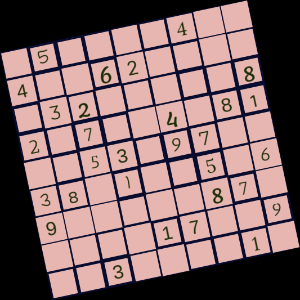

data/demo_test/Copy of 4977.png
our representation: _5____4__4__62_____32_____82_7__4_89__53_97__38_9__5_69_____87_____17__5__3____1_
our solution:       no solution
solution:           856931427479628153132745968297564381615389742384172596961253874528417639743896215
Inccorect


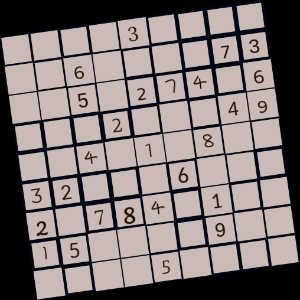

data/demo_test/Copy of 4978.png
our representation: ____3______6____73__5_274_6___2___49__4_9_8__32___6___2_784_2__15____9______5____
our solution:       no solution
solution:           792634518416598273835127496681275349574913862329486751267849135153762984948351627
Inccorect


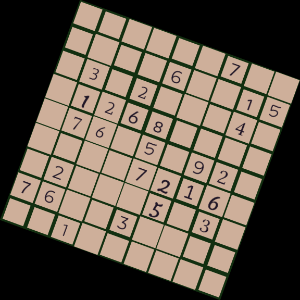

data/demo_test/Copy of 4979.png
our representation: ______7______6__95_3_3___4__1268_____76_5_92_____7216__2___5_3_76__3______1______
our solution:       no solution
solution:           648513792297468315135297846912684573476351928583972164829145637764839251351726489
Inccorect


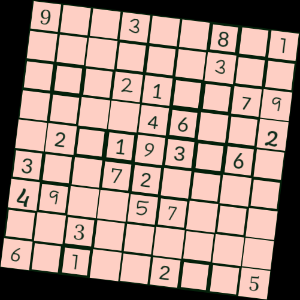

data/demo_test/Copy of 4980.png
our representation: 9__3__8_1______3_____21__79____46__2_2_193_6_3__72____49__57_____3______6_1__2__5
our solution:       962374851187569324534218679719846532825193467346725198498657213253981746671432985
solution:           962374851187569324534218679719846532825193467346725198498657213253981746671432985
Correct!


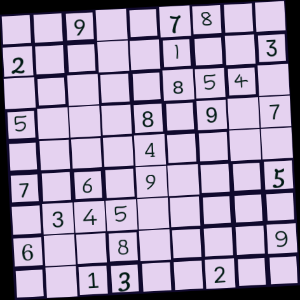

data/demo_test/Copy of 4981.png
our representation: __9__78__2____1__3_____854_5___8_9_7____4____7_6_9___5_345_____6__8____9__13__2__
our solution:       459637821268451793317928546542186937193745682786293415934572168625814379871369254
solution:           459637821268451793317928546542186937193745682786293415934572168625814379871369254
Correct!


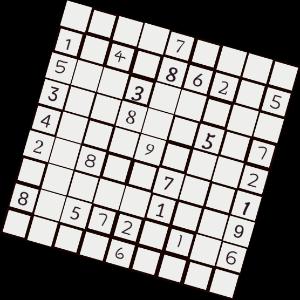

data/demo_test/Copy of 4982.png
our representation: ____7____9_4_863_55__3_____3__8__5_74___4___22_8__7__1_____1__98_572_5_6____6____
our solution:       no solution
solution:           689275413134986275572314968361842597457193682298657341726431859845729136913568724
Inccorect


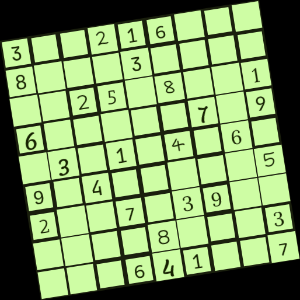

data/demo_test/Copy of 4983.png
our representation: 3__226___8___3______25_8__16_____7_9_3_1_4_6_9_4_____52__7_39______8___3___641__7
our solution:       no solution
solution:           359216478871439526462578391618325749735194862924867135286753914147982653593641287
Inccorect


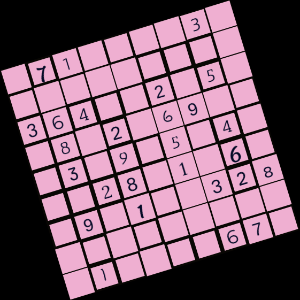

data/demo_test/Copy of 4984.png
our representation: _71____3__________364__2_5__8_2_69___3_9_5_4___28_1_6__9_1__328__________1____67_
our solution:       871459236529613487364782159487236915136975842952841763795164328648327591213598674
solution:           871459236529613487364782159487236915136975842952841763795164328648327591213598674
Correct!


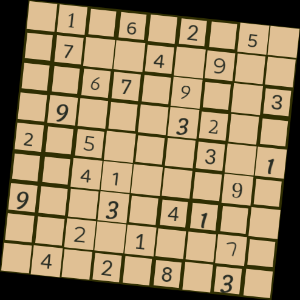

data/demo_test/Copy of 4985.png
our representation: _1_6_2_5__7__4_9____67_9__3_9___33__2_5___3_1__41___9_9__3_41____2_1__7__4_2_8_3_
our solution:       419632758873541926526789413197423385265897341384156297958374162632915874741268539
solution:           419632758873541926526789413198453267265897341734126895957364182382915674641278539
Inccorect


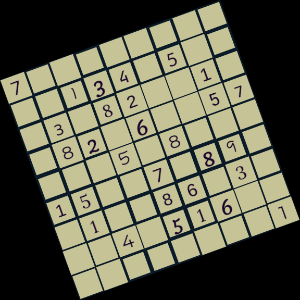

data/demo_test/Copy of 4986.png
our representation: 7__________134_5___3_82__1__82_6__57___5_8___15__7_89__1__86_3___4_516__________1
our solution:       749615283821349576635827419982164357473598162156273894217486935394751628568932741
solution:           749615283821349576635827419982164357473598162156273894217486935394751628568932741
Correct!


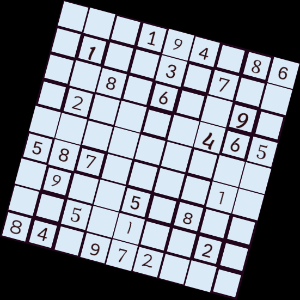

data/demo_test/Copy of 4987.png
our representation: ___194_86_1__3_7____8_6__9__2____465_________587____1__9__5_8____5_1__2_84_972___
our solution:       732194586916835742458267193329781465164529378587643219291456837675318924843972651
solution:           732194586916835742458267193329781465164529378587643219291456837675318924843972651
Correct!


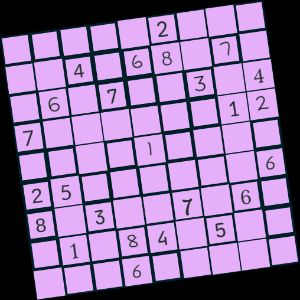

data/demo_test/Copy of 4988.png
our representation: _____2_____4_68_7__6_7__3_47______12____1____25______68_3__7_6__1_84_5_____6_____
our solution:       197432685324568971568791324736985412489216753251374896843157269612849537975623148
solution:           197432685324568971568791324736985412489216753251374896843157269612849537975623148
Correct!


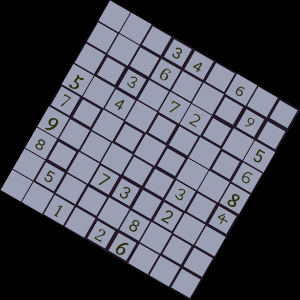

data/demo_test/Copy of 4989.png
our representation: ___34_6_____6___9___3_72__55_4_____67_______89_____3_48__73_2___5___8_____1_26___
our solution:       185349672427651893693872145514983726732564918968217354849735261256198437371426589
solution:           185349672427651893693872145514983726732564918968217354849735261256198437371426589
Correct!


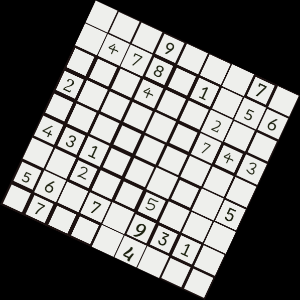

data/demo_test/Copy of 4990.png
our representation: ___9___7__478_1_56___4__2__2_____743_________431_____5__2__5___56_7_931__7___4___
our solution:       825936174347821956619457238256198743798543621431672895982315467564789312173264589
solution:           825936174347821956619457238256198743798543621431672895982315467564789312173264589
Correct!


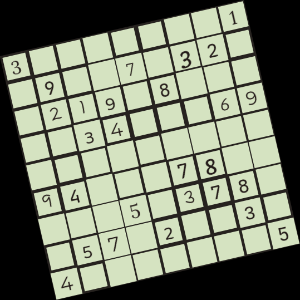

data/demo_test/Copy of 4991.png
our representation: 3_______1_9__7_32__219_8_____34___69_________94___78_____5_378__57_2__3_4_______5
our solution:       378245691594671328621938547783452169215869473946317852162593784857124936439786215
solution:           378245691594671328621938547783452169215869473946317852162593784857124936439786215
Correct!


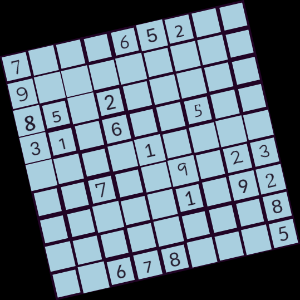

data/demo_test/Copy of 4992.png
our representation: 7___652__9________85_2_____31_6__5______1______7__9_23_____1_92________8__678___5
our solution:       741865239962143857853297461319672584524318976687459123478531692135926748296784315
solution:           741865239962143857853297461319672584524318976687459123478531692135926748296784315
Correct!


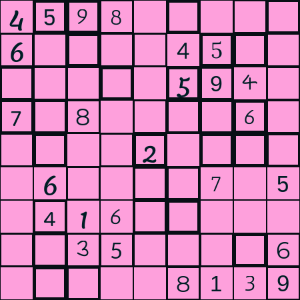

data/demo_test/Copy of 4993.png
our representation: 4598_____6____45_______584_7_8____6_____2_____6____7_5_416_______35____6_____8139
our solution:       no solution
solution:           459872613612934578387165942728459361135726894964381725841693257293517486576248139
Inccorect


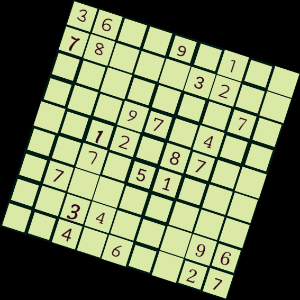

data/demo_test/Copy of 4994.png
our representation: 36__9_9__78___32_________7____97_4____12_87____7_51____7_________34___96__4_6__27
our solution:       no solution
solution:           362794158785613249419582673528976431931248765647351982276839514153427896894165327
Inccorect


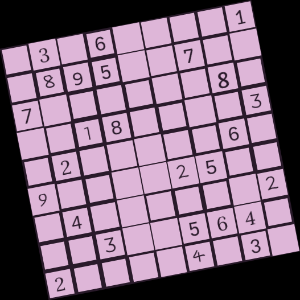

data/demo_test/Copy of 4995.png
our representation: _3_6____1_895__7__7______8___18____3_2_____6_9____25___4______2__3__564_2____4_3_
our solution:       532678491189543726764921385451896273328157964976432518647389152893215647215764839
solution:           532678491189543726764921385451896273328157964976432518647389152893215647215764839
Correct!


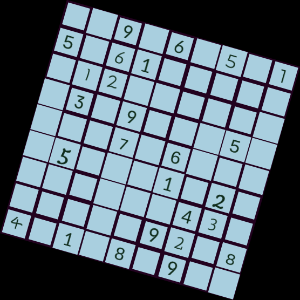

data/demo_test/Copy of 4996.png
our representation: __9_6_5_15_61______12_______3_9___5____7_6____5___1_2_______43______92_84_1_8_9__
our solution:       849263571576194382312875694134928756298756143657431829985612437763549218421387965
solution:           849263571576194382312875694134928756298756143657431829985612437763549218421387965
Correct!


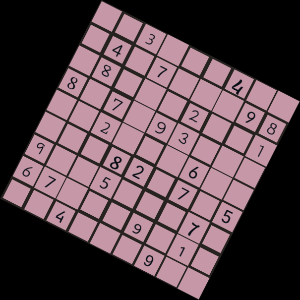

data/demo_test/Copy of 4997.png
our representation: __3___4___4_7___98_8___2__18_7_93_____2___6_____82_7_59__5___7_67___9_1___4___9__
our solution:       563918427241756398789342561857693142132475689496821735918564273675239814324187956
solution:           563918427241756398789342561857693142132475689496821735918564273675239814324187956
Correct!


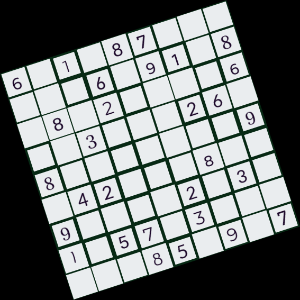

data/demo_test/Copy of 4998.png
our representation: 6_1_87______6_91_8_8_2____6__3___26_8_______9_42___8__9____2_3_1_57_3______85_9_7
our solution:       621587394457639128389214576593478261816325749742961853978142635165793482234856917
solution:           621587394457639128389214576593478261816325749742961853978142635165793482234856917
Correct!


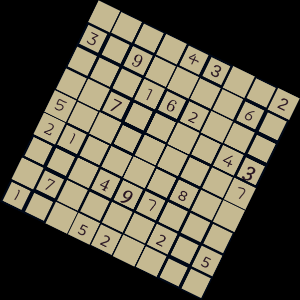

data/demo_test/Copy of 4999.png
our representation: ____43__23_9____6____162_____7____435_______721____8_____497____7____2_51__52____
our solution:       761943582329785461845162739987256143536814927214379856652497318478631295193528674
solution:           761943582329785461845162739987256143536814927214379856652497318478631295193528674
Correct!
acc score = 0.47


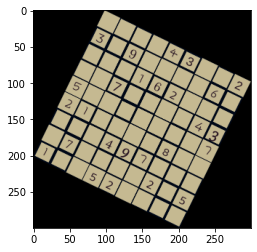

In [159]:
NN_sample_test(4900, 5000)